In [1]:
import jax
jax.config.update("jax_enable_x64", True)
import jax.numpy as jnp
import numpy as np

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import matplotlib.gridspec as gridspec
%matplotlib inline
import cmasher as cmr
cmap=cmr.sunburst_r

import numpyro
import numpyro.distributions as dist
from numpyro.infer import MCMC, NUTS, SVI, Predictive, Trace_ELBO
from numpyro.infer.autoguide import AutoDelta, AutoNormal, AutoDiagonalNormal

from stream_membership import ComponentMixtureModel, ModelComponent
from stream_membership.distributions import IndependentGMM, TruncatedNormalSpline, DirichletSpline, TruncatedNormal1DSplineMixture
from stream_membership.plot import plot_data_projections

import astropy.table as at
import astropy.units as u

import pickle
from scipy.interpolate import InterpolatedUnivariateSpline as IUS
from scipy.optimize import curve_fit

In [2]:
import importlib
import sys
sys.path.append('../../')

import scripts.initialize_stream as init_stream
from scripts.run_full_gd1_model import *

from cats.pawprint.pawprint import Pawprint, Footprint2D
from cats.CMD import Isochrone
from cats.inputs import stream_inputs as inputs
from cats.proper_motions import ProperMotionSelection, rough_pm_poly

In [3]:
# this file now automatically includes the cut on magnitude (on work desktop). Should fix this for minimal confusion later
data = at.Table.read("/Users/Tavangar/Work/gd1-dr3/data/GD1-region-alldata.fits")

In [4]:
pawprint,iso_obj,iso_mask,hb_mask,pmsel,pm_mask = run_CATS(data, stream_name='GD-1', phi1_lim=[-100,20])

# run_sel = pm_mask & (iso_mask | hb_mask)
# run_data_ = iso_obj.cat[run_sel]
# stream_sel0 = pmsel.pm12_mask & (iso_mask | hb_mask) & iso_obj.on_skymask
# stream_data0 = iso_obj.cat[stream_sel0]
# def f(x,a,b):
#     return a*x+b
# popt,_ = curve_fit(f, np.array(stream_data0['phi1'][~np.isnan(stream_data0['rv']).mask]), np.array(stream_data0['rv'][~np.isnan(stream_data0['rv']).mask]))
# stream_sel = stream_sel0 & ((np.isnan(iso_obj.cat['rv'])) | (np.abs(iso_obj.cat['rv'] - f(iso_obj.cat['phi1'], *popt)) < 50))
# stream_data_ = iso_obj.cat[stream_sel]

# bkg_data_ = iso_obj.cat[run_sel & ~stream_sel]

# post_cats = {'run_data': run_data_,
#          'bkg_data': bkg_data_,
#          'stream_data': stream_data_,
#          'pawprint': pawprint,
#          'iso_obj': iso_obj}
# with open('../../data/post_cats_data.pkl', 'wb') as param_file:
#     pickle.dump(post_cats, param_file)

with open('../../data/post_cats_data.pkl', 'rb') as input_file_:
    post_cats = pickle.load(input_file_)
run_data_ = post_cats['run_data']
bkg_data_ = post_cats['bkg_data']
stream_data_ = post_cats['stream_data']
pawprint = post_cats['pawprint']
iso_obj = post_cats['iso_obj']

Modifying/extrapolating galstreams track
Modifying/extrapolating galstreams track
-40.18182129005669
Fitting for peak pm location
Pre-fitting mean PM values: -13.031, -3.108
Post-fitting (pm1_mean, pm2_mean, pm1_std, pm2_std): [np.float64(-13.26720538330726), np.float64(-3.1634227867925135), np.float64(0.5151487185597746), np.float64(0.38624247171130377)] 

Producing the polygon and mask


/Users/Tavangar/Work/stream-membership/stream-env/lib/python3.12/site-packages/cats/CMD.py:293: RuntimeWarning: invalid value encountered in divide
  signal = signal / signal_counts


In [6]:
def poly1(x, a, b):
    return a * x + b
params1, cov1 = curve_fit(poly1, xdata=stream_data_['phi1'][~np.isnan(stream_data_['rv'])], 
                                         ydata=stream_data_['rv'][~np.isnan(stream_data_['rv'])], )

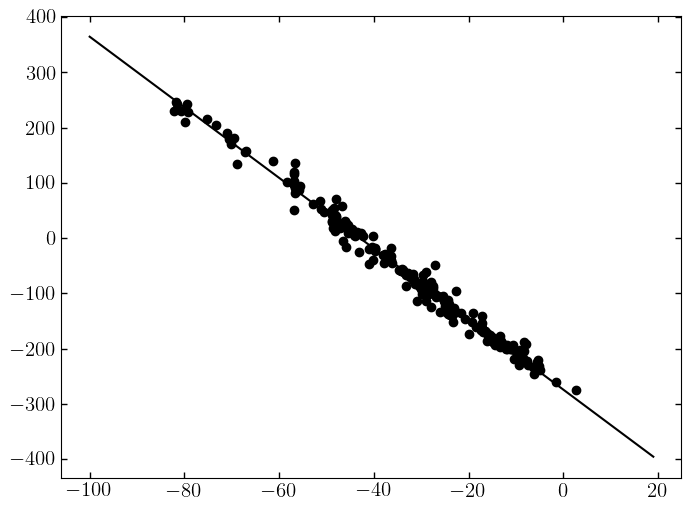

In [7]:
plt.scatter(stream_data_['phi1'][stream_data_['rv']!=0],stream_data_['rv'][stream_data_['rv']!=0])
plt.plot(np.arange(-100,20,1), poly1(np.arange(-100,20,1), *params1))

In [8]:
only_rv_run_data = {k: jnp.array(run_data_[k], dtype="f8") for k in ['phi1', 'phi2', 'pm1', 'pm2', 'rv']}
only_rv_bkg_data = {k: jnp.array(bkg_data_[k], dtype="f8") for k in ['phi1', 'phi2', 'pm1', 'pm2', 'rv']}
only_rv_stream_data = {k: jnp.array(stream_data_[k], dtype="f8") for k in ['phi1', 'phi2', 'pm1', 'pm2', 'rv']}

# Fill in rv data for rows without it (rv=0, rv_err=1e4)
run_data_['rv'][run_data_['rv'].mask] = 0
run_data_['rv_err'][run_data_['rv_err'].mask] = 1e4

bkg_data_['rv'][bkg_data_['rv'].mask] = 0
bkg_data_['rv_err'][bkg_data_['rv_err'].mask] = 1e4

stream_data_['rv'][stream_data_['rv'].mask] = poly1(stream_data_['phi1'][stream_data_['rv'].mask], *params1)
stream_data_['rv_err'][stream_data_['rv_err'].mask] = 1e4

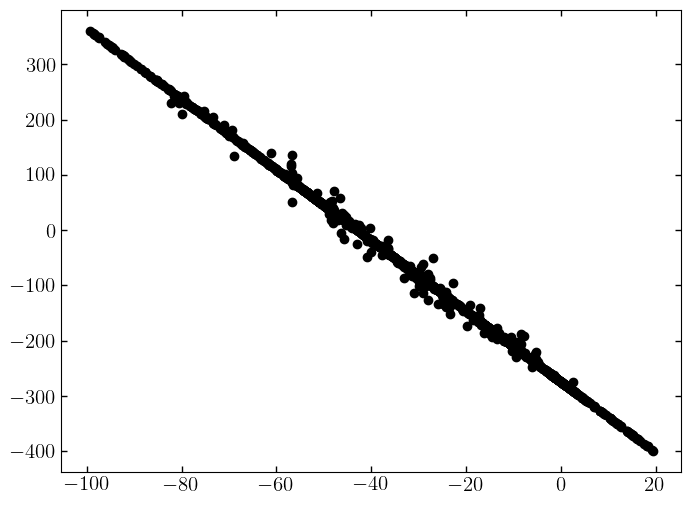

In [9]:
plt.scatter(stream_data_['phi1'], stream_data_['rv'])

In [10]:
run_data = {k: jnp.array(run_data_[k], dtype="f8") for k in ['phi1', 'phi2', 'pm1', 'pm2', 'rv']}#run_data_.colnames}
run_data_err = {'pm1': jnp.array(run_data_['pm1_error'], dtype="f8"),
                'pm2': jnp.array(run_data_['pm2_error'], dtype="f8"),
                'rv': jnp.array(run_data_['rv_err'], dtype="f8")}

bkg_data = {k: jnp.array(bkg_data_[k], dtype="f8") for k in ['phi1', 'phi2', 'pm1', 'pm2', 'rv']}#bkg_data_.colnames}
bkg_data_err = {'pm1': jnp.array(bkg_data_['pm1_error'], dtype="f8"),
                'pm2': jnp.array(bkg_data_['pm2_error'], dtype="f8"),
                'rv': jnp.array(bkg_data_['rv_err'], dtype="f8")}

stream_data = {k: jnp.array(stream_data_[k], dtype="f8") for k in ['phi1', 'phi2', 'pm1', 'pm2', 'rv']}#stream_data_.colnames}
stream_data_err = {'pm1': jnp.array(stream_data_['pm1_error'], dtype="f8"),
                   'pm2': jnp.array(stream_data_['pm2_error'], dtype="f8"),
                   'rv': jnp.array(stream_data_['rv_err'], dtype="f8")}

In [11]:
cmd_poly = iso_obj.pawprint.cmdprint.vertices - jnp.array([0,iso_obj.dist_mod])
cmd_patch = mpl.patches.Polygon(cmd_poly, facecolor="red", alpha=0.2)
hb_poly = iso_obj.pawprint.hbprint.vertices - jnp.array([0,iso_obj.dist_mod])
hb_patch = mpl.patches.Polygon(hb_poly, facecolor="red", alpha=0.2)

pm_poly = iso_obj.pawprint.pmprint.vertices
pm_patch = mpl.patches.Polygon(pm_poly, facecolor="cyan", alpha=0.15)

distmod_spl = np.poly1d([2.41e-4, 2.421e-2, 15.001])
dist_mod_correct_all = distmod_spl(iso_obj.cat["phi1"]) - iso_obj.dist_mod

In [12]:
coord_bounds, plot_grids = init_stream.get_bounds_and_grids(run_data, pawprint)
    
phi1_lim = coord_bounds['phi1']
phi2_lim = coord_bounds['phi2']
pm1_lim  = coord_bounds['pm1']
pm2_lim  = coord_bounds['pm2']
rv_lim   = coord_bounds['rv']

In [15]:
bkg_knot_spacings    = jnp.array([40,40,40,40])
stream_knot_spacings = jnp.array([5,10,10,10,10])
offtrack_dx          = jnp.array([3,1])

stream_bkg_specs = jnp.concatenate([bkg_knot_spacings, stream_knot_spacings])
specifications = jnp.concatenate([bkg_knot_spacings, stream_knot_spacings, offtrack_dx])

svi_results_dir = '/Users/Tavangar/Work/gd1-dr3/svi_results/'
filename = svi_results_dir + 'full_mm_bkg{}_{}_{}_{}_stream{}_{}_{}_{}_{}_off{}_{}.pkl'.format(*specifications)
filename = svi_results_dir + 'full_mm_bkg40_40_40_40_stream5_10_10_10_10_off3_1_auto_normal2.pkl'.format(*specifications)

with open(filename, 'rb') as input_file_:
    full_dict = pickle.load(input_file_)
    
previous_svi_results = full_dict['svi_results']
previous_guide = full_dict['guide']
previous_params = full_dict['params']

# try to start with an offtrack that is pretty close:
# old_svi_results_dir = '/Users/Tavangar/Work/gd1-dr3/svi_results/old_init/'
# # filename = svi_results_dir + 'full_mm_bkg{}_{}_{}_stream{}_{}_{}_{}_off{}_{}.pkl'.format(*specifications)
# old_filename = old_svi_results_dir + 'full_mm_bkg{}_{}_{}_{}_stream{}_{}_{}_{}_{}_off{}_{}.pkl'.format(*specifications)

# with open(old_filename, 'rb') as input_file_:
#     old_full_dict = pickle.load(input_file_)
    
# old_svi_results = old_full_dict['svi_results']
# old_guide = old_full_dict['guide']

stream_bkg_mm_filename = svi_results_dir + 'mm_bkg{}_{}_{}_{}_stream{}_{}_{}_{}_{}.pkl'.format(*stream_bkg_specs)
with open(stream_bkg_mm_filename, 'rb') as input_file_:
    stream_bkg_mm_dict = pickle.load(input_file_)
no_off_svi_results = stream_bkg_mm_dict['svi_results']
no_off_guide = stream_bkg_mm_dict['guide']
stream_bkg_params = stream_bkg_mm_dict['params']

## Continuing Background

In [116]:
bkg_knot_spacings = jnp.array([40,40,40,40])

svi_results_dir = '/Users/Tavangar/Work/gd1-dr3/svi_results/'
# filename = svi_results_dir + 'full_mm_bkg{}_{}_{}_stream{}_{}_{}_{}_off{}_{}.pkl'.format(*specifications)
# bkg_filename = svi_results_dir + 'bkg_{}_{}_{}_{}_auto_delta.pkl'.format(*bkg_knot_spacings)

# with open(bkg_filename, 'rb') as input_file_:
#     full_dict = pickle.load(input_file_)
    
# bkg_svi_results = full_dict['svi_results']
# bkg_guide = full_dict['guide']

In [117]:
n_mixture=2
bkg_model = init_stream.make_bkg_model_component(knot_spacings=bkg_knot_spacings, n_mixture=n_mixture, 
                                                    coord_bounds=coord_bounds, data=bkg_data)

n_phi1_knots = bkg_model.coord_parameters['phi1']['locs'].shape[-1]
n_pm1_knots = bkg_model.coord_parameters['pm1']['knots'].shape[-1]
n_pm2_knots = bkg_model.coord_parameters['pm2']['knots'].shape[-1]
n_rv_knots = bkg_model.coord_parameters['rv']['knots'].shape[-1]

bkg_init_params = {
    "phi1": {
        "mixing_distribution": jnp.ones(n_phi1_knots) / n_phi1_knots,
        "scales": jnp.full(n_phi1_knots, bkg_knot_spacings[0])
    },
    "phi2": {},
    "pm1": {
        "mixing_distribution": jnp.ones((n_mixture, n_pm1_knots)) / n_mixture,
        "loc_vals": jnp.full((n_mixture, n_pm1_knots), 0),
        "scale_vals": jnp.full((n_mixture, n_pm1_knots), 5.0),
    },
    "pm2": {
        "mixing_distribution": jnp.ones((n_mixture, n_pm2_knots)) / n_mixture,
        "loc_vals": jnp.full((n_mixture, n_pm2_knots), -3.0),
        "scale_vals": jnp.full((n_mixture, n_pm2_knots), 3.0),
    },
    "rv": {
        "mixing_distribution": jnp.ones((n_mixture, n_rv_knots)) / n_mixture,
        "loc_vals": jnp.full((n_mixture, n_rv_knots), -100),
        "scale_vals": jnp.full((n_mixture,n_rv_knots), 50),
    },
}

In [139]:
bkg_init_params = bkg_svi_results.params

In [140]:
# del bkg_init_params['background:rv:loc_vals_auto_loc']
# del bkg_init_params['background:rv:scale_vals_auto_loc']
# del bkg_init_params['background:rv:mixing_distribution_auto_loc']

In [118]:
bkg_frozen_params = {}#{'background:phi1:mixing_distribution_auto_loc',
                     # 'background:phi1:scales_auto_loc',
                     # 'background:pm1:loc_vals_auto_loc',
                     # 'background:pm1:mixing_distribution_auto_loc', 
                     # 'background:pm1:scale_vals_auto_loc',
                     # 'background:pm2:loc_vals_auto_loc', 
                     # 'background:pm2:mixing_distribution_auto_loc', 
                     # 'background:pm2:scale_vals_auto_loc',
                     # # 'background:rv:loc_vals_auto_loc', 
                     # # 'background:rv:mixing_distribution_auto_loc',
                     # # 'background:rv:scale_vals_auto_loc', 
                     # 'background:pm1:modeldata_auto_loc', 'background:pm2:modeldata_auto_loc', 'background:rv:modeldata_auto_loc'}
# Parameter grouping
def bkg_param_labels(param_tree):
    """
    Assign labels to parameters based on whether they should be frozen or trainable.
    """
    labels = {}
    for key in param_tree.keys():
        labels[key] = "frozen" if key in bkg_frozen_params else "trainable"
    return labels

In [120]:
keys=jax.random.split(jax.random.PRNGKey(42), num=2)
init_lr = 1e-1
num_steps = 2_000

# Define step intervals
eighth_steps = num_steps // 8
quarter_steps = num_steps // 4
half_steps = num_steps // 2

lr_schedule = optax.join_schedules(
        schedules=[
            # optax.constant_schedule(init_lr),
            optax.cosine_decay_schedule(init_value=init_lr, decay_steps=1000, alpha=1e-1),
            optax.cosine_decay_schedule(init_value=init_lr/10, decay_steps=3000, alpha=1e-1),
            optax.cosine_decay_schedule(init_value=init_lr/100, decay_steps=3000, alpha=1e-1),
            optax.cosine_decay_schedule(init_value=init_lr/1000, decay_steps=2000, alpha=1e-1),
        ],
        boundaries=[1000, 
                    4000,
                    7000,
                   ]
    )


# Define optimizers for frozen and trainable parameters
frozen_optimizer = optax.set_to_zero()  # No updates for frozen parameters
trainable_optimizer = optax.chain(optax.clip(10.),
                                optax.adam(learning_rate=lr_schedule)
                                )
# trainable_optimizer = optax.chain(optax.clip(10),
#                                 optax.adam(learning_rate=5e-2)
#                                 )


# # Combine with `optax.masked`
# masked_optimizer = optax.chain(optax.clip(10.),
#                                optax.masked(optax.adam(learning_rate=lr_schedule), mask_fn),  # Mask updates for frozen parameters
#                                optax.set_to_zero()  # Explicitly zero out gradients for masked parameters
# )
# Combine optimizers using multi_transform
bkg_masked_optimizer = optax.multi_transform(
    {
        "frozen": frozen_optimizer,
        "trainable": trainable_optimizer,
    },
    bkg_param_labels
)

# Convert to NumPyro optimizer
bkg_optimizer = numpyro.optim.optax_to_numpyro(bkg_masked_optimizer)
bkg_guide = AutoNormal(
        bkg_model, init_loc_fn=numpyro.infer.init_to_value(values=bkg_init_params)
    )
svi = SVI(bkg_model, bkg_guide, bkg_optimizer, Trace_ELBO(num_particles=5))
with numpyro.validation_enabled(), jax.debug_nans():
    # Initialize and run the SVI optimization
    bkg_init_state = svi.init(keys[0], init_params=bkg_init_params, data=bkg_data, err=bkg_data_err)
    print(svi.evaluate(bkg_init_state, data=bkg_data, err=bkg_data_err))

1334842503.805574


In [121]:
bkg_svi_results = svi.run(
            rng_key=keys[1], num_steps=7_000, init_state=bkg_init_state, 
            data=bkg_data, err=bkg_data_err
        )

100%|███████████████████████████████████████████████████████████████████████████████████| 7000/7000 [2:29:06<00:00,  1.28s/it, init loss: 1334842503.8056, avg. loss [6651-7000]: 1724040.3250]


In [155]:
bkg_svi_results = svi.run(
            rng_key=keys[1], num_steps=3_000, init_state=bkg_svi_results.state, 
            data=bkg_data, err=bkg_data_err
        )

100%|████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:05<00:00,  1.95it/s, init loss: 1604790.0946, avg. loss [10-10]: 1545488.7106]


1724030.3578931624


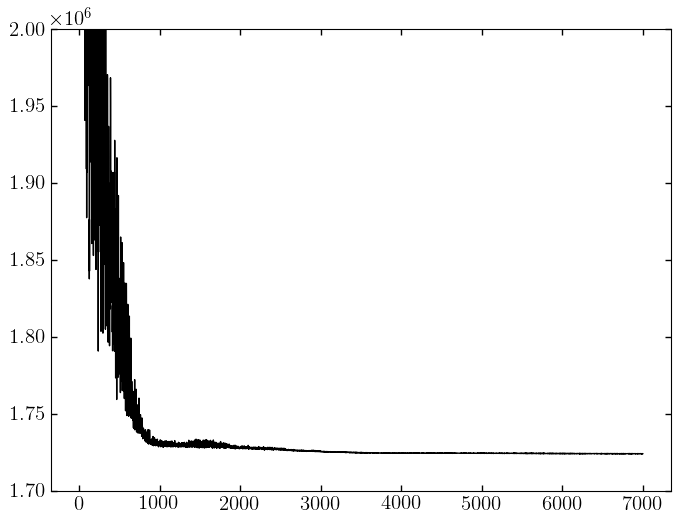

In [125]:
print(bkg_svi_results.losses[-1])
plt.plot(bkg_svi_results.losses, lw=1)
plt.ylim(1.7e6, 2e6)
# plt.yscale('log')

plt.show()

In [126]:
bkg_params = get_svi_params(model=bkg_model, data=bkg_data, svi_results=bkg_svi_results, 
                            guide=bkg_guide, num_samples=1, key=jax.random.PRNGKey(12345))

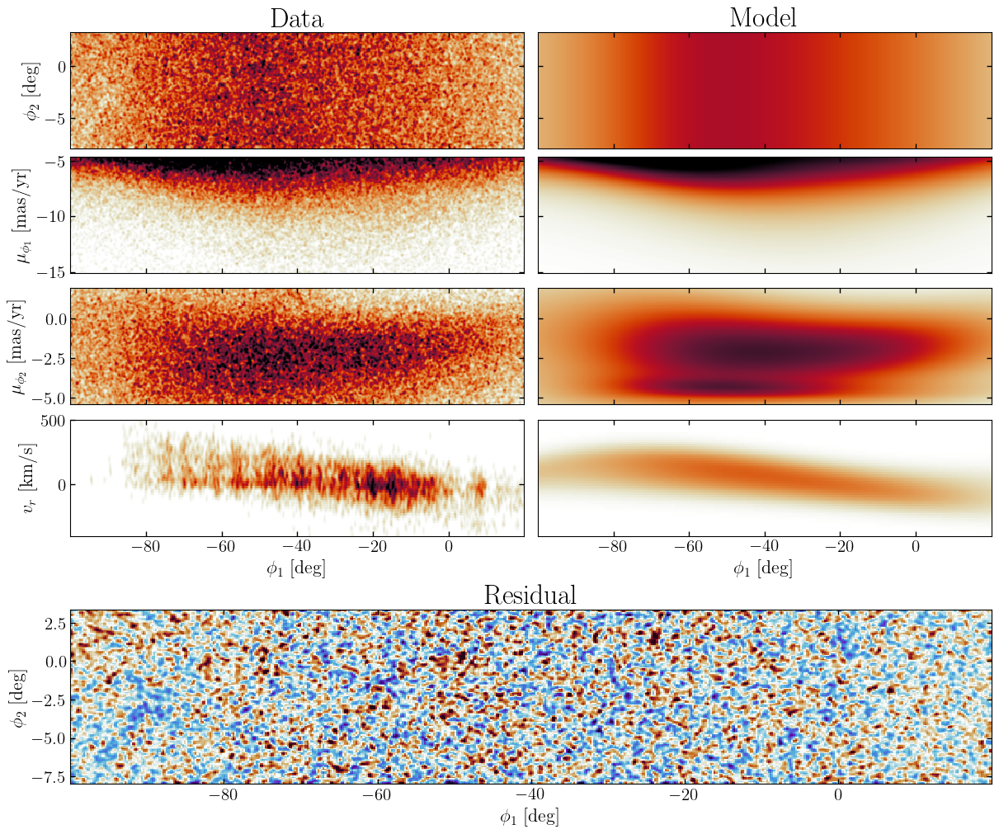

In [127]:
fig = plt.figure(figsize=(12, 10), constrained_layout=True)
gs = gridspec.GridSpec(5, 2, height_ratios=[1, 1, 1, 1, 1.5], figure=fig, hspace=0, wspace=0)

ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1], sharex=ax1, sharey=ax1)
ax3 = fig.add_subplot(gs[1, 0], sharex=ax1)
ax4 = fig.add_subplot(gs[1, 1], sharex=ax1, sharey=ax3)
ax5 = fig.add_subplot(gs[2, 0], sharex=ax1)
ax6 = fig.add_subplot(gs[2, 1], sharex=ax1, sharey=ax5)
ax7 = fig.add_subplot(gs[3, 0], sharex=ax1)
ax8 = fig.add_subplot(gs[3, 1], sharex=ax1, sharey=ax7)

ax9 = fig.add_subplot(gs[4, :], sharex=ax1)

plot_data_projections(
    data=bkg_data,
    grids=plot_grids,
    axes=ax3,
    coord_names=[('phi1', 'pm1')],
    pcolormesh_kwargs=dict(rasterized=True, vmax=5, vmin=0, cmap=cmap)
)
plot_data_projections(
    data=bkg_data,
    grids=plot_grids,
    axes=[ax1, ax5],
    pcolormesh_kwargs=dict(rasterized=True, vmax=3, vmin=0, cmap=cmap),
    coord_names=[('phi1', 'phi2'), ('phi1', 'pm2')]
)
plot_data_projections(
    data=only_rv_bkg_data,
    grids=plot_grids,
    axes=ax7,
    pcolormesh_kwargs=dict(rasterized=True, vmax=3, vmin=0, cmap=cmap),
    coord_names=[('phi1', 'rv')]
)

bkg_model.plot_model_projections(ndata=len(bkg_data_), grids=plot_grids, 
                          grid_coord_names=[('phi1', 'phi2'), ('phi1', 'pm1')],
                          pars=bkg_params, axes=[ax2,ax4], label=False,
                          pcolormesh_kwargs=dict(rasterized=True, vmax=5, vmin=0, cmap=cmap))
bkg_model.plot_model_projections(ndata=len(run_data_['rv'][run_data_['rv']!=0]), grids=plot_grids, grid_coord_names=[('phi1', 'phi2'), ('phi1', 'rv')],
                          pars=bkg_params, axes=[ax2,ax8], label=False,
                          pcolormesh_kwargs=dict(rasterized=True, vmax=3, vmin=0, cmap=cmap))
bkg_model.plot_model_projections(ndata=len(run_data_), grids=plot_grids, grid_coord_names=[('phi1', 'phi2'), ('phi1', 'pm2')],
                          pars=bkg_params, axes=[ax2,ax6], label=False,
                          pcolormesh_kwargs=dict(rasterized=True, vmax=3, vmin=0, cmap=cmap))

bkg_model.plot_residual_projections(
    grids=plot_grids, pars=bkg_params,
    data=bkg_data, axes=ax9, label=True, 
    pcolormesh_kwargs=dict(vmin=-1, vmax=1, rasterized=True, cmap=cmr.fusion),
    grid_coord_names=[('phi1', 'phi2')]
)


for ax in [ax1,ax2,ax3,ax4,ax5,ax6]:
    ax.label_outer()
ax8.yaxis.set_visible(False)
ax8.set_ylim(-400,500)

ax1.set_title('Data', fontsize=24)
ax2.set_title('Model', fontsize=24)
ax9.set_title('Residual', fontsize=24, pad=5)

# plt.savefig('../../paper_figures/bkg_model.pdf')
plt.show()

In [130]:
bkg_svi_results.params

{'background:phi1:mixing_distribution_auto_loc': Array([-0.35825411, -0.03427786,  4.49740541], dtype=float64),
 'background:phi1:mixing_distribution_auto_scale': Array([0.02505961, 0.01700885, 0.46270512], dtype=float64),
 'background:phi1:scales_auto_loc': Array([3.84765771, 2.84046269, 3.38199681, 3.56237081], dtype=float64),
 'background:phi1:scales_auto_scale': Array([0.01921676, 0.01696194, 0.01049842, 0.28755708], dtype=float64),
 'background:pm1:loc_vals_auto_loc': Array([[ 0.62709862, -0.81282853, -0.62359322, -0.14827967],
        [ 2.97403799, -0.76227153, -1.58555204,  0.77626728]],      dtype=float64),
 'background:pm1:loc_vals_auto_scale': Array([[0.04564042, 0.0098142 , 0.01206303, 0.04067987],
        [0.49053995, 0.0259443 , 0.0377468 , 0.13311921]], dtype=float64),
 'background:pm1:mixing_distribution_auto_loc': Array([0.62419829], dtype=float64),
 'background:pm1:mixing_distribution_auto_scale': Array([0.01579337], dtype=float64),
 'background:pm1:modeldata_auto_loc'

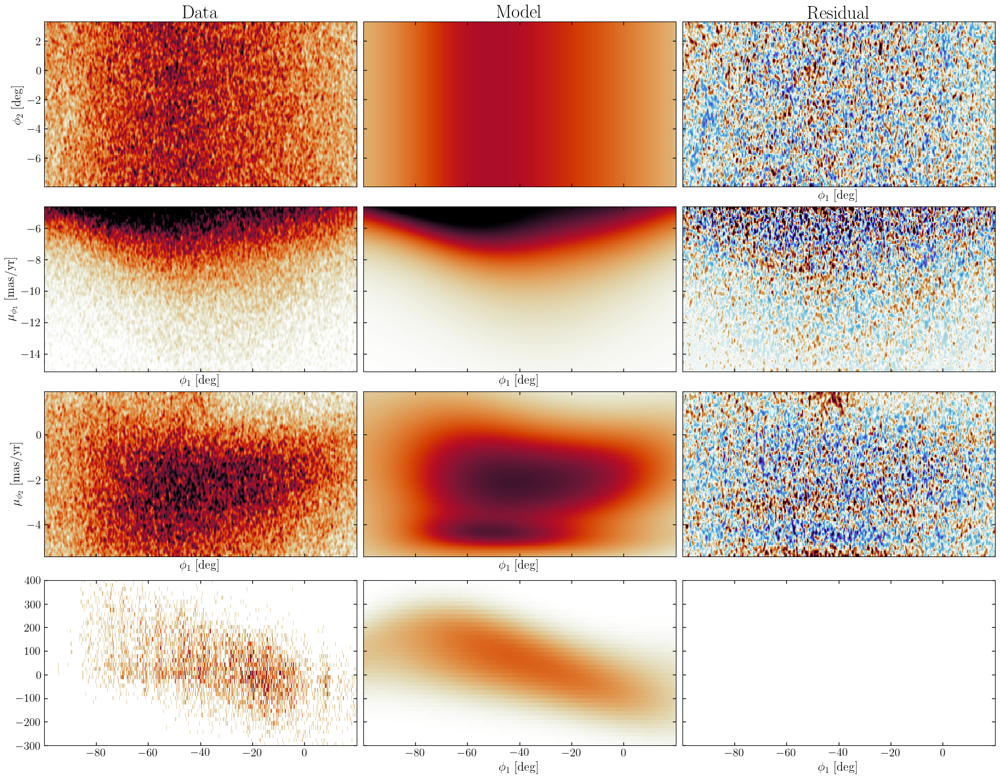

In [129]:
fig, axes = plt.subplots(
    len(bkg_model.coord_names) - 1,
    3,
    figsize=(18, 3.5 * (len(bkg_model.coord_names) - 1)),
    sharex=True,
    sharey="row",
    constrained_layout=True,
)

axes = np.atleast_2d(axes)
plot_data_projections(
    data=bkg_data,
    grids=plot_grids,
    axes=axes[1, 0],
    pcolormesh_kwargs=dict(rasterized=True, vmax=5, vmin=0, cmap=cmap),
    coord_names=[('phi1', 'pm1')]
)
plot_data_projections(
    data=bkg_data,
    grids=plot_grids,
    axes=[axes[0, 0], axes[2,0]],
    pcolormesh_kwargs=dict(rasterized=True, vmax=3, vmin=0, cmap=cmap),
    coord_names=[('phi1', 'phi2'), ('phi1', 'pm2')]
)
axes[3,0].hist2d(bkg_data_['phi1'][bkg_data_['rv'] != 0], bkg_data_['rv'][bkg_data_['rv'] != 0], bins=[512, 128], range=[[phi1_lim[0],phi1_lim[1]], [rv_lim[0],rv_lim[1]]], cmap=cmap)

# bkg_model.plot_model_projections(ndata=len(bkg_data_), grids=plot_grids, pars=MAP_p_bkg_expanded, axes=axes[:, 1], label=False,
#                                      pcolormesh_kwargs=dict(rasterized=True, vmax=5, vmin=0))
bkg_model.plot_model_projections(ndata=len(run_data_), grids=plot_grids, grid_coord_names=[('phi1', 'pm1')],
                                 pars=bkg_params, axes=axes[1, 1], label=False,
                                 pcolormesh_kwargs=dict(rasterized=True, vmax=5, vmin=0, cmap=cmap))
bkg_model.plot_model_projections(ndata=len(run_data_), grids=plot_grids, grid_coord_names=[('phi1', 'phi2'), ('phi1', 'pm2')],
                                 pars=bkg_params, axes=[axes[0, 1], axes[2,1]], label=False,
                                 pcolormesh_kwargs=dict(rasterized=True, vmax=3, vmin=0, cmap=cmap))
bkg_model.plot_model_projections(ndata=len(run_data_['rv'][run_data_['rv']!=0]), grids=plot_grids, grid_coord_names=[('phi1', 'rv')],
                                 pars=bkg_params, axes=axes[3, 1], label=False,
                                 pcolormesh_kwargs=dict(rasterized=True, vmax=3, vmin=0, cmap=cmap))

bkg_model.plot_residual_projections(
    grids=plot_grids, grid_coord_names=[('phi1', 'phi2')], 
    pars=bkg_params,
    data=bkg_data, axes=axes[0, 2], label=False, 
    pcolormesh_kwargs=dict(vmin=-1, vmax=1, cmap=cmr.fusion, rasterized=True)
)
bkg_model.plot_residual_projections(
    grids=plot_grids, grid_coord_names=[('phi1', 'pm1'), ('phi1', 'pm2')],
    pars=bkg_params, data=bkg_data, axes=axes[1:, 2], label=False, 
    pcolormesh_kwargs=dict(vmin=-1, vmax=1, cmap=cmr.fusion, rasterized=True)
)


axes[3,0].set_ylim(-300, 400) ; axes[3,1].set_ylim(-300, 400)

axes[0][0].set_title('Data', fontsize=24)
axes[0][1].set_title('Model', fontsize=24)
axes[0][2].set_title('Residual', fontsize=24)
plt.show()

In [131]:
bkg_filename = svi_results_dir + 'bkg_{}_{}_{}_{}_auto_normal.pkl'.format(*bkg_knot_spacings)
bkg_dict = {'svi_results': bkg_svi_results,
            'guide': bkg_guide,
            'params': bkg_params
           }
with open(bkg_filename, 'wb') as param_file:
    pickle.dump(bkg_dict, param_file)

## Continuing Stream

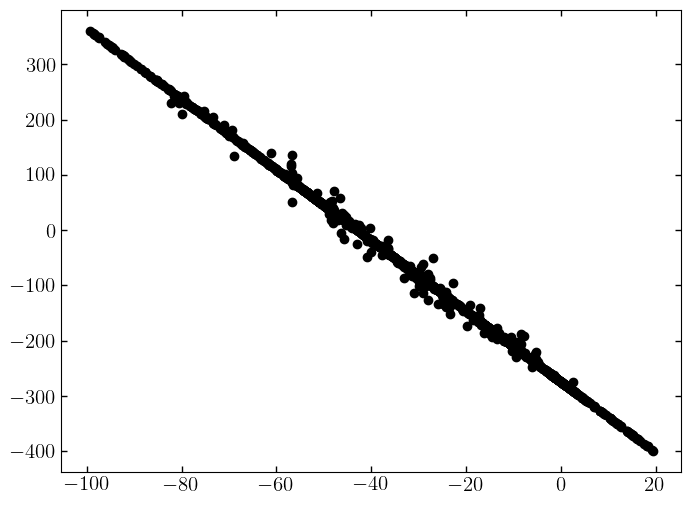

In [193]:
plt.scatter(stream_data['phi1'], stream_data['rv'])

In [194]:
stream_knot_spacings = jnp.array([5,10,10,10,10])

svi_results_dir = '/Users/Tavangar/Work/gd1-dr3/svi_results/'
# filename = svi_results_dir + 'full_mm_bkg{}_{}_{}_stream{}_{}_{}_{}_off{}_{}.pkl'.format(*specifications)
stream_filename = svi_results_dir + 'stream_{}_{}_{}_{}_{}_auto_delta.pkl'.format(*stream_knot_spacings)

with open(stream_filename, 'rb') as input_file_:
    full_dict = pickle.load(input_file_)
    
stream_svi_results = full_dict['svi_results']
stream_guide = full_dict['guide']

In [195]:
rv_min = jnp.min(stream_data['phi1'][stream_data_err['rv'] !=1e4])
rv_max = jnp.max(stream_data['phi1'][stream_data_err['rv'] != 1e4])
print(rv_min, rv_max)

stream_model = init_stream.make_stream_model_component(knot_spacings=stream_knot_spacings,
                                                       coord_bounds=coord_bounds, data=stream_data, rv_min=rv_min, rv_max=rv_max)

-82.29245517329116 2.604766566458774


In [196]:
stream_phi1_knots = stream_model.coord_parameters['phi1']['locs'][0]
stream_phi2_knots = stream_model.coord_parameters['phi2']['knots']
stream_pm1_knots = stream_model.coord_parameters['pm1']['knots']
stream_pm2_knots = stream_model.coord_parameters['pm2']['knots']
stream_rv_knots = stream_model.coord_parameters['rv']['knots']

_interp_dict = init_stream.interpolate_stream_tracks(stream_data, phi1_lim)
eval_interp_phi2 = jnp.array(_interp_dict['phi2'](stream_phi2_knots))
eval_interp_pm1 = jnp.array(_interp_dict['pm1'](stream_pm1_knots))
eval_interp_pm2 = jnp.array(_interp_dict['pm2'](stream_pm2_knots))
eval_interp_rv = jnp.array(_interp_dict['rv'](stream_rv_knots))

stream_init_params = {
    "phi1": {
        "mixing_distribution": jnp.ones(len(stream_phi1_knots))
        / len(stream_phi1_knots),
        "scales": jnp.full(stream_phi1_knots.shape[0], stream_knot_spacings[0]),
    },
    "phi2": {
        "loc_vals": eval_interp_phi2,
        "scale_vals": jnp.full(stream_phi2_knots.shape[0], 0.5),
    },
    "pm1": {
        "loc_vals": eval_interp_pm1,
        "scale_vals": jnp.full(stream_pm1_knots.shape[0], 0.35),
    },
    "pm2": {
        "loc_vals": eval_interp_pm2,
        "scale_vals": jnp.full(stream_pm2_knots.shape[0], 0.35),
    },
    "rv": {
        "loc_vals": poly1(stream_rv_knots,*params1),
        "scale_vals": jnp.full(stream_rv_knots.shape[0], 4),
    },
}

In [265]:
stream_init_params = stream_svi_results.params

In [197]:
stream_frozen_params = {}#{'stream:pm1:modeldata_auto_loc', 'stream:pm2:modeldata_auto_loc', 'stream:rv:modeldata_auto_loc'}
# Parameter grouping
def stream_param_labels(param_tree):
    """
    Assign labels to parameters based on whether they should be frozen or trainable.
    """
    labels = {}
    for key in param_tree.keys():
        labels[key] = "frozen" if key in stream_frozen_params else "trainable"
    return labels

In [198]:
keys=jax.random.split(jax.random.PRNGKey(1234), num=2)
init_lr = 1e-1
num_steps = 12_000

# Define step intervals
eighth_steps = num_steps // 8
quarter_steps = num_steps // 4
half_steps = num_steps // 2

lr_schedule = optax.join_schedules(
        schedules=[
            # optax.constant_schedule(init_lr),
            # optax.constant_schedule(7e-3),
            optax.cosine_decay_schedule(init_value=init_lr, decay_steps=4_000, alpha=1e-1),
            optax.cosine_decay_schedule(init_value=init_lr/10, decay_steps=10_000, alpha=1e-1),
            optax.cosine_decay_schedule(init_value=init_lr/100, decay_steps=10_000, alpha=1e-1),
        ],
        boundaries=[4_000,
                    14_000,
                    # 20_000
                   ]
    )


# Define optimizers for frozen and trainable parameters
frozen_optimizer = optax.set_to_zero()  # No updates for frozen parameters
trainable_optimizer = optax.chain(optax.clip(10.),
                                optax.adam(learning_rate=lr_schedule)
                                )
# trainable_optimizer = optax.chain(optax.clip(10),
#                                 optax.adam(learning_rate=8e-3)
#                                 )


# # Combine with `optax.masked`
# masked_optimizer = optax.chain(optax.clip(10.),
#                                optax.masked(optax.adam(learning_rate=lr_schedule), mask_fn),  # Mask updates for frozen parameters
#                                optax.set_to_zero()  # Explicitly zero out gradients for masked parameters
# )
# Combine optimizers using multi_transform
stream_masked_optimizer = optax.multi_transform(
    {
        "frozen": frozen_optimizer,
        "trainable": trainable_optimizer,
    },
    stream_param_labels
)

# Convert to NumPyro optimizer
stream_optimizer = numpyro.optim.optax_to_numpyro(stream_masked_optimizer)

stream_guide = AutoNormal(
        stream_model, init_loc_fn=numpyro.infer.init_to_value(values=stream_init_params)
    )
svi = SVI(stream_model, stream_guide, stream_optimizer, Trace_ELBO(num_particles=3))
with numpyro.validation_enabled(), jax.debug_nans():
    # Initialize and run the SVI optimization
    stream_init_state = svi.init(keys[0], init_params=stream_init_params, data=stream_data, err=stream_data_err)
    print(svi.evaluate(stream_init_state, data=stream_data, err=stream_data_err))

6782081.648049502


In [199]:
stream_svi_results = svi.run(
            rng_key=keys[1], num_steps=24_000, init_state=stream_init_state, 
            data=stream_data, err=stream_data_err
        )

100%|█████████████████████████████████████████████████████████████████████████████████████| 24000/24000 [02:26<00:00, 163.43it/s, init loss: 6782081.6480, avg. loss [22801-24000]: 22109.5924]


In [165]:
stream_svi_results = svi.run(
            rng_key=keys[1], num_steps=2_000, init_state=stream_svi_results.state, 
            data=stream_data, err=stream_data_err
        )

100%|███████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [00:18<00:00, 106.22it/s, init loss: 22457.6157, avg. loss [1901-2000]: 22464.1491]


22104.97998374878


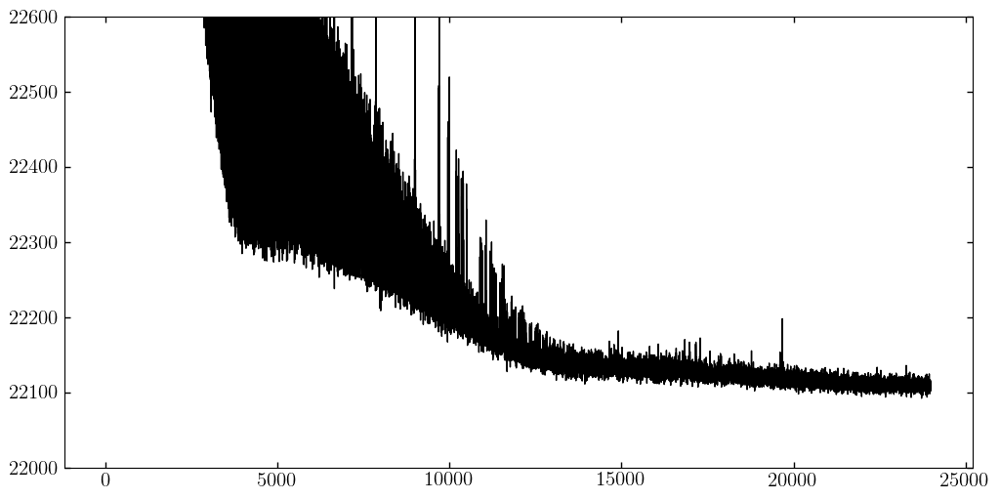

In [201]:
plt.figure(figsize=(12,6))
plt.plot(stream_svi_results.losses, lw=1)
print(stream_svi_results.losses[-1])
plt.ylim(22000,22600)
# plt.xlim(9950, 10000)
plt.show()

In [202]:
stream_params = get_svi_params(model=stream_model, data=stream_data, svi_results=stream_svi_results, 
                               guide=stream_guide, num_samples=100, key=jax.random.PRNGKey(12345))

In [203]:
pred_dist = Predictive(stream_guide, params=stream_svi_results.params, num_samples=100)
pars_ = pred_dist(jax.random.PRNGKey(42), data=stream_data)

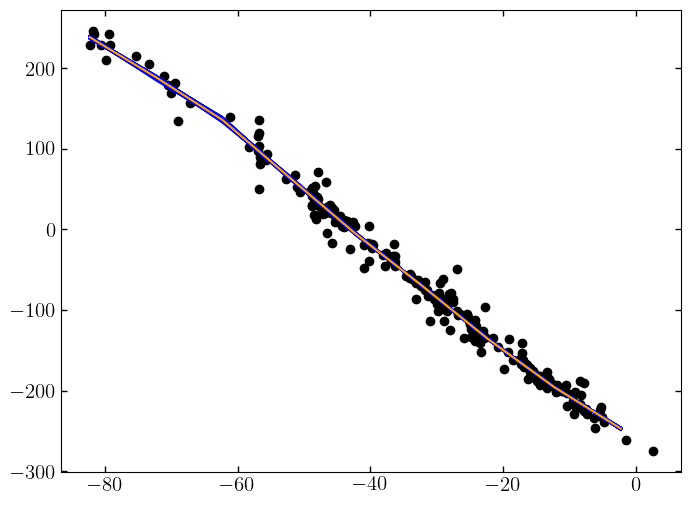

In [204]:
for i in range(pars_[f'stream:rv:loc_vals'].shape[0]):
    plt.plot(stream_rv_knots, pars_[f'stream:rv:loc_vals'][i], c='b')
plt.plot(stream_rv_knots, stream_params['rv']['loc_vals'], c='orange')
plt.scatter(stream_data['phi1'][stream_data_err['rv']!=1e4], stream_data['rv'][stream_data_err['rv']!=1e4])
plt.show()

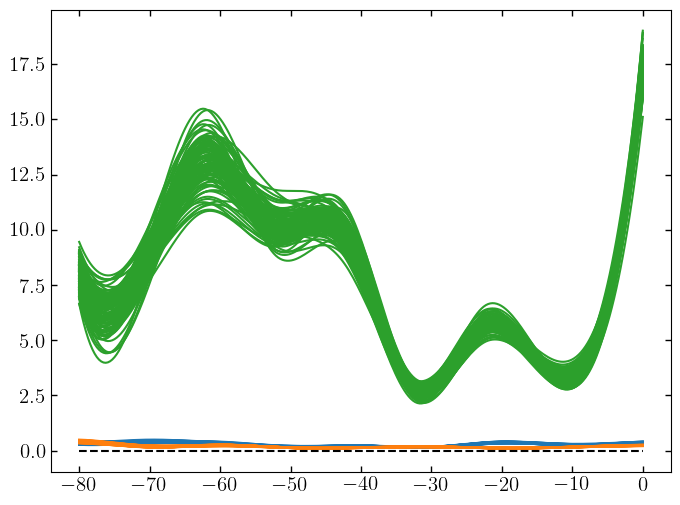

In [205]:
xgrid = np.linspace(-80, 0, 256)

for name, color in zip(["pm1", "pm2","rv"], ["tab:blue", "tab:orange", "tab:green"]):
    spl_grid = np.zeros((pars_[f'stream:{name}:scale_vals'].shape[0], len(xgrid)))
    for i in range(pars_[f'stream:{name}:scale_vals'].shape[0]):
        spl = IUS(stream_model.coord_parameters[name]['knots'], pars_[f'stream:{name}:scale_vals'][i], k=3)
        spl_grid[i] = spl(xgrid)
    plt.plot(xgrid, spl_grid.T, alpha=1, color=color);
plt.hlines(0, xmin=-80, xmax=0, ls='--')
# plt.ylim(-0.05,1)

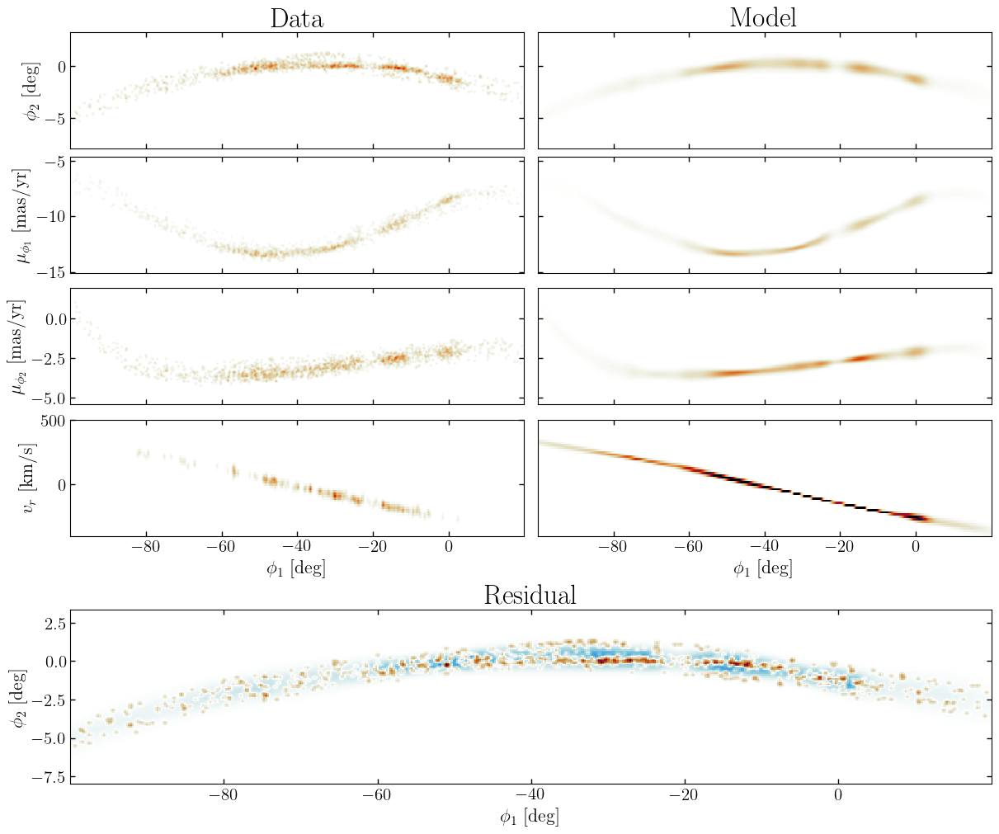

In [206]:
fig = plt.figure(figsize=(12, 10), constrained_layout=True)
gs = gridspec.GridSpec(5, 2, height_ratios=[1, 1, 1, 1, 1.5], figure=fig, hspace=0, wspace=0)

ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1], sharex=ax1, sharey=ax1)
ax3 = fig.add_subplot(gs[1, 0], sharex=ax1)
ax4 = fig.add_subplot(gs[1, 1], sharex=ax1, sharey=ax3)
ax5 = fig.add_subplot(gs[2, 0], sharex=ax1)
ax6 = fig.add_subplot(gs[2, 1], sharex=ax1, sharey=ax5)
ax7 = fig.add_subplot(gs[3, 0], sharex=ax1)
ax8 = fig.add_subplot(gs[3, 1], sharex=ax1, sharey=ax7)

ax9 = fig.add_subplot(gs[4, :], sharex=ax1)

plot_data_projections(
    data=stream_data,
    grids=plot_grids,
    axes=ax3,
    coord_names=[('phi1', 'pm1')],
    pcolormesh_kwargs=dict(rasterized=True, vmax=5, vmin=0, cmap=cmap)
)
plot_data_projections(
    data=stream_data,
    grids=plot_grids,
    axes=[ax1, ax5],
    pcolormesh_kwargs=dict(rasterized=True, vmax=3, vmin=0, cmap=cmap),
    coord_names=[('phi1', 'phi2'), ('phi1', 'pm2')]
)
plot_data_projections(
    data=only_rv_stream_data,
    grids=plot_grids,
    axes=ax7,
    pcolormesh_kwargs=dict(rasterized=True, vmax=3, vmin=0, cmap=cmap),
    coord_names=[('phi1', 'rv')]
)

stream_model.plot_model_projections(ndata=len(stream_data_), grids=plot_grids, 
                          grid_coord_names=[('phi1', 'phi2'), ('phi1', 'pm1')],
                          pars=stream_params, axes=[ax2,ax4], label=False,
                          pcolormesh_kwargs=dict(rasterized=True, vmax=5, vmin=0, cmap=cmap))
stream_model.plot_model_projections(ndata=len(stream_data_['rv'][stream_data_['rv']!=0]), grids=plot_grids, grid_coord_names=[('phi1', 'phi2'), ('phi1', 'rv')],
                          pars=stream_params, axes=[ax2,ax8], label=False,
                          pcolormesh_kwargs=dict(rasterized=True, vmax=3, vmin=0, cmap=cmap))
stream_model.plot_model_projections(ndata=len(stream_data_), grids=plot_grids, grid_coord_names=[('phi1', 'phi2'), ('phi1', 'pm2')],
                          pars=stream_params, axes=[ax2,ax6], label=False,
                          pcolormesh_kwargs=dict(rasterized=True, vmax=3, vmin=0, cmap=cmap))

stream_model.plot_residual_projections(
    grids=plot_grids, pars=stream_params,
    data=stream_data, axes=ax9, label=True, 
    pcolormesh_kwargs=dict(vmin=-1, vmax=1, rasterized=True, cmap=cmr.fusion),
    grid_coord_names=[('phi1', 'phi2')]
)


for ax in [ax1,ax2,ax3,ax4,ax5,ax6]:
    ax.label_outer()
ax8.yaxis.set_visible(False)
ax8.set_ylim(-400,500)

ax1.set_title('Data', fontsize=24)
ax2.set_title('Model', fontsize=24)
ax9.set_title('Residual', fontsize=24, pad=5)

# plt.savefig('../../paper_figures/bkg_model.pdf')
plt.show()

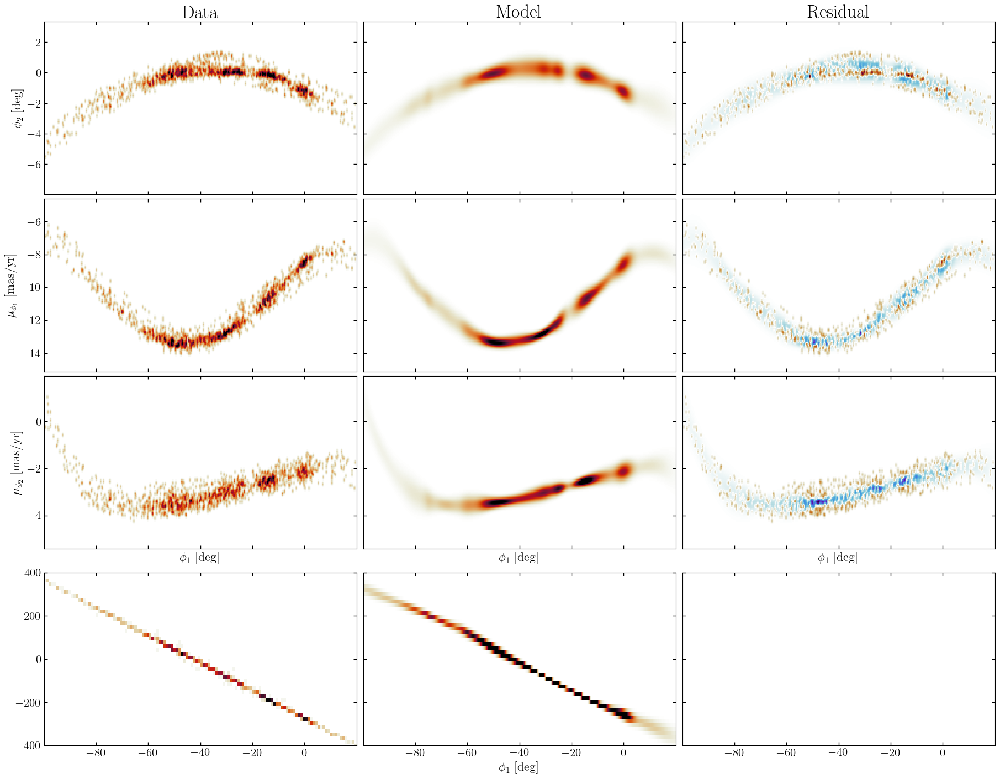

In [207]:
fig, axes = plt.subplots(
    len(stream_model.coord_names) - 1,
    3,
    figsize=(18, 3.5 * (len(stream_model.coord_names) - 1)),
    sharex=True,
    sharey="row",
    constrained_layout=True,
)

axes = np.atleast_2d(axes)
plot_data_projections(
    data=stream_data,
    grids=plot_grids,
    coord_names=[('phi1','phi2'), ('phi1', 'pm1'), ('phi1', 'pm2')],
    axes=axes[:3, 0],
    pcolormesh_kwargs=dict(rasterized=True, vmax=1, vmin=0, cmap=cmap)
    # coord_names=GD1BackgroundModel.coord_names,
)
axes[3,0].hist2d(stream_data_['phi1'][stream_data_['rv'] != 0], stream_data_['rv'][stream_data_['rv'] != 0], bins=[128, 128], range=[[phi1_lim[0],phi1_lim[1]], [rv_lim[0],rv_lim[1]]], cmap=cmap)


stream_model.plot_model_projections(ndata=len(stream_data_), grids=plot_grids, grid_coord_names=[('phi1','phi2'), ('phi1', 'pm1'), ('phi1', 'pm2')],
                                    pars=stream_params, axes=axes[:3, 1], label=False,
                                     pcolormesh_kwargs=dict(rasterized=True, vmax=1, vmin=0, cmap=cmap))
stream_model.plot_model_projections(ndata=len(stream_data_), grids=plot_grids, grid_coord_names=[('phi1','rv')],
                                    pars=stream_params, axes=axes[3, 1], label=False,
                                    pcolormesh_kwargs=dict(rasterized=True, vmax=2, vmin=0, cmap=cmap))

stream_model.plot_residual_projections(
    grids=plot_grids, pars=stream_params, grid_coord_names=[('phi1','phi2'), ('phi1', 'pm1'), ('phi1', 'pm2')],
    data=stream_data, axes=axes[:3, 2], label=False, 
    pcolormesh_kwargs=dict(vmin=-1, vmax=1, cmap=cmr.fusion, rasterized=True)
)
axes[3,0].set_ylim(-400, 400)
axes[0][0].set_title('Data', fontsize=24)
axes[0][1].set_title('Model', fontsize=24)
axes[0][2].set_title('Residual', fontsize=24)
plt.show()

In [208]:
stream_filename = svi_results_dir + 'stream_{}_{}_{}_{}_{}_auto_normal.pkl'.format(*stream_knot_spacings)
stream_dict = {'svi_results': stream_svi_results,
            'guide': stream_guide,
               'params': stream_params
           }
with open(stream_filename, 'wb') as param_file:
    pickle.dump(stream_dict, param_file)

## Continuing Stream+Background

In [191]:
bkg_knot_spacings    = jnp.array([40,40,40,40])
stream_knot_spacings = jnp.array([5,10,10,10,10])

specs = jnp.concatenate([bkg_knot_spacings, stream_knot_spacings])

In [192]:
svi_results_dir = '/Users/Tavangar/Work/gd1-dr3/svi_results/'
stream_bkg_mm_filename = svi_results_dir + 'mm_bkg{}_{}_{}_{}_stream{}_{}_{}_{}_{}_auto_normal.pkl'.format(*specs)
# with open(stream_bkg_mm_filename, 'rb') as input_file_:
#     stream_bkg_mm_dict = pickle.load(input_file_)
# no_off_svi_results = stream_bkg_mm_dict['svi_results']
# no_off_guide = stream_bkg_mm_dict['guide']

# for_modeldata_filename = svi_results_dir + 'mm_bkg40_40_40_40_stream5_20_20_20_20.pkl'
# with open(for_modeldata_filename, 'rb') as input_file_:
#     modeldata_dict = pickle.load(input_file_)
# for_modeldata_results = modeldata_dict['svi_results']

In [132]:
bkg_filename = svi_results_dir + 'bkg_{}_{}_{}_{}_auto_normal.pkl'.format(*bkg_knot_spacings)

with open(bkg_filename, 'rb') as input_file_:
    full_dict = pickle.load(input_file_)
    
bkg_svi_results = full_dict['svi_results']
bkg_guide = full_dict['guide']
bkg_params = full_dict['params']

stream_filename = svi_results_dir + 'stream_{}_{}_{}_{}_{}_auto_normal.pkl'.format(*stream_knot_spacings)

with open(stream_filename, 'rb') as input_file_:
    full_dict = pickle.load(input_file_)
    
stream_svi_results = full_dict['svi_results']
stream_guide = full_dict['guide']
stream_params = full_dict['params']

In [133]:
bkg_model_mm = init_stream.make_bkg_model_component(knot_spacings=bkg_knot_spacings, n_mixture=2, 
                                                    coord_bounds=coord_bounds, data=run_data)
stream_model_mm = init_stream.make_stream_model_component(knot_spacings=stream_knot_spacings, 
                                                          coord_bounds=coord_bounds, data=run_data)
stream_bkg_mm = ComponentMixtureModel(dist.Dirichlet(jnp.array([1.0, 1.0])), 
                                          components=[bkg_model_mm, stream_model_mm])



In [135]:
bkg_model_mm.pack_params(bkg_params)

{'background:phi1:mixing_distribution': Array([0.18874372, 0.26469274, 0.53830774, 0.0082558 ], dtype=float64),
 'background:phi1:scales': Array([51.75927831, 21.28345883, 33.19377635, 31.66705739], dtype=float64),
 'background:pm1:loc_vals': Array([[ 2.97253995, -3.74756682, -3.04608767, -0.99453543],
        [ 9.16204815, -3.61584767, -6.64419613,  3.17630026]],      dtype=float64),
 'background:pm1:mixing_distribution': Array([0.64860009, 0.35139991], dtype=float64),
 'background:pm1:modeldata': Array([-5.11044173, -6.7081455 , -5.37526615, ..., -9.30849881,
        -6.44683048, -5.47920743], dtype=float64),
 'background:pm1:scale_vals': Array([[3.36095093, 2.29984359, 2.88611803, 2.90399523],
        [7.16192965, 4.44437572, 3.56790703, 7.89963701]], dtype=float64),
 'background:pm2:loc_vals': Array([[-4.76368353, -4.40733775, -4.6578164 , -4.6734963 ],
        [-1.11120694, -2.01386752, -2.03015005, -1.33541855]],      dtype=float64),
 'background:pm2:mixing_distribution': Array([

In [136]:
init_params = bkg_svi_results.params | stream_svi_results.params
# init_params = no_off_svi_results.params
init_params["mixture-probs"] = jnp.array([0.98, 0.02])


# bkg_indices = np.where(np.isin(run_data['phi1'], bkg_data['phi1']))[0]
# stream_indices = np.where(np.isin(run_data['phi1'], stream_data['phi1']))[0]

# modeldata = np.zeros((len(run_data['phi1']), 5))
# modeldata[:,0] = run_data['phi1']
# modeldata[:,1] = run_data['phi2']
# modeldata_scale = np.zeros((len(run_data['phi1']), 5))
# modeldata_scale[:,0] = np.full(len(run_data['phi1']), 1e-4)
# modeldata_scale[:,1] = np.full(len(run_data['phi2']), 1e-4)

# modeldata[stream_indices,2] = stream_svi_results.params['stream:pm1:modeldata_auto_loc']
# modeldata[stream_indices,3] = stream_svi_results.params['stream:pm2:modeldata_auto_loc']
# modeldata[stream_indices,4] = stream_svi_results.params['stream:rv:modeldata_auto_loc']
# modeldata[bkg_indices,2] = bkg_svi_results.params['background:pm1:modeldata_auto_loc']
# modeldata[bkg_indices,3] = bkg_svi_results.params['background:pm2:modeldata_auto_loc']
# modeldata[bkg_indices,4] = bkg_svi_results.params['background:rv:modeldata_auto_loc']

# modeldata_scale[stream_indices,2] = stream_svi_results.params['stream:pm1:modeldata_auto_scale']
# modeldata_scale[stream_indices,3] = stream_svi_results.params['stream:pm2:modeldata_auto_scale']
# modeldata_scale[stream_indices,4] = stream_svi_results.params['stream:rv:modeldata_auto_scale']
# modeldata_scale[bkg_indices,2] = bkg_svi_results.params['background:pm1:modeldata_auto_scale']
# modeldata_scale[bkg_indices,3] = bkg_svi_results.params['background:pm2:modeldata_auto_scale']
# modeldata_scale[bkg_indices,4] = bkg_svi_results.params['background:rv:modeldata_auto_scale']

# init_params['mixture:modeldata_auto_loc'] = modeldata
# init_params['mixture:modeldata_auto_scale'] = modeldata_scale
del init_params['background:pm1:modeldata_auto_loc']
del init_params['background:pm1:modeldata_auto_scale']
del init_params['background:pm2:modeldata_auto_loc']
del init_params['background:pm2:modeldata_auto_scale']
del init_params['background:rv:modeldata_auto_loc']
del init_params['background:rv:modeldata_auto_scale']
del init_params['stream:pm1:modeldata_auto_loc']
del init_params['stream:pm1:modeldata_auto_scale']
del init_params['stream:pm2:modeldata_auto_loc']
del init_params['stream:pm2:modeldata_auto_scale']
del init_params['stream:rv:modeldata_auto_loc']
del init_params['stream:rv:modeldata_auto_scale']

In [137]:
init_params

{'background:phi1:mixing_distribution_auto_loc': Array([-0.35825411, -0.03427786,  4.49740541], dtype=float64),
 'background:phi1:mixing_distribution_auto_scale': Array([0.02505961, 0.01700885, 0.46270512], dtype=float64),
 'background:phi1:scales_auto_loc': Array([3.84765771, 2.84046269, 3.38199681, 3.56237081], dtype=float64),
 'background:phi1:scales_auto_scale': Array([0.01921676, 0.01696194, 0.01049842, 0.28755708], dtype=float64),
 'background:pm1:loc_vals_auto_loc': Array([[ 0.62709862, -0.81282853, -0.62359322, -0.14827967],
        [ 2.97403799, -0.76227153, -1.58555204,  0.77626728]],      dtype=float64),
 'background:pm1:loc_vals_auto_scale': Array([[0.04564042, 0.0098142 , 0.01206303, 0.04067987],
        [0.49053995, 0.0259443 , 0.0377468 , 0.13311921]], dtype=float64),
 'background:pm1:mixing_distribution_auto_loc': Array([0.62419829], dtype=float64),
 'background:pm1:mixing_distribution_auto_scale': Array([0.01579337], dtype=float64),
 'background:pm1:scale_vals_auto_loc

In [194]:
init_params = stream_bkg_svi_results.params

In [209]:
stream_bkg_frozen_params = {#'mixture:modeldata_auto_loc',
                 # 'mixture-probs_auto_loc',
                 'background:phi1:mixing_distribution_auto_loc', 'background:phi1:mixing_distribution_auto_scale', 
                 'background:phi1:scales_auto_loc', 'background:phi1:scales_auto_scale', 
                 'background:pm1:loc_vals_auto_loc', 'background:pm1:loc_vals_auto_scale', 
                 'background:pm1:mixing_distribution_auto_loc', 'background:pm1:mixing_distribution_auto_scale', 
                 'background:pm1:scale_vals_auto_loc', 'background:pm1:scale_vals_auto_scale', 
                 'background:pm2:loc_vals_auto_loc', 'background:pm2:loc_vals_auto_scale', 
                 'background:pm2:mixing_distribution_auto_loc', 'background:pm2:mixing_distribution_auto_scale', 
                 'background:pm2:scale_vals_auto_loc', 'background:pm2:scale_vals_auto_scale', 
                 'background:rv:loc_vals_auto_loc', 'background:rv:loc_vals_auto_scale', 
                 'background:rv:mixing_distribution_auto_loc', 'background:rv:mixing_distribution_auto_scale', 
                 'background:rv:scale_vals_auto_loc', 'background:rv:scale_vals_auto_scale',
                 'stream:phi1:mixing_distribution_auto_loc', 'stream:phi1:mixing_distribution_auto_scale', 
                 'stream:phi1:scales_auto_loc', 'stream:phi1:scales_auto_scale', 
                 'stream:phi2:loc_vals_auto_loc', 'stream:phi2:loc_vals_auto_scale', 
                 'stream:phi2:scale_vals_auto_loc', 'stream:phi2:scale_vals_auto_scale', 
                 'stream:pm1:loc_vals_auto_loc', 'stream:pm1:loc_vals_auto_scale', 
                 'stream:pm1:scale_vals_auto_loc', 'stream:pm1:scale_vals_auto_scale', 
                 'stream:pm2:loc_vals_auto_loc', 'stream:pm2:loc_vals_auto_scale', 
                 'stream:pm2:scale_vals_auto_loc', 'stream:pm2:scale_vals_auto_scale', 
                 'stream:rv:loc_vals_auto_loc', 'stream:rv:loc_vals_auto_scale', 
                 'stream:rv:scale_vals_auto_loc', 'stream:rv:scale_vals_auto_scale',
                }
# Parameter grouping
def stream_bkg_param_labels(param_tree):
    """
    Assign labels to parameters based on whether they should be frozen or trainable.
    """
    labels = {}
    for key in param_tree.keys():
        labels[key] = "frozen" if key in stream_bkg_frozen_params else "trainable"
    return labels

In [210]:
keys=jax.random.split(jax.random.PRNGKey(42), num=2)
init_lr = 1e-3
num_steps=10_000

# stream_bkg_optimizer = numpyro.optim.ClippedAdam(1e-2)

# Define the base optimizer
# base_optimizer = optax.adam(learning_rate=init_lr)

# Define step intervals
fiftieth_steps = num_steps // 50
tenth_steps = num_steps // 10
quarter_steps = num_steps // 4
half_steps = num_steps // 2

lr_schedule = optax.join_schedules(
        schedules=[
            # optax.constant_schedule(init_lr),
            optax.cosine_decay_schedule(init_value=init_lr, decay_steps=500, alpha=1e-1),
            optax.cosine_decay_schedule(init_value=init_lr/10, decay_steps=2_000, alpha=1e-1),
            optax.cosine_decay_schedule(init_value=init_lr/100, decay_steps=4_000, alpha=1e-1),
            optax.cosine_decay_schedule(init_value=init_lr/1000, decay_steps=3_000, alpha=1e-1),
        ],
        boundaries=[500, 
                    2_500,
                    6_500
                   ]
    )


# Define optimizers for frozen and trainable parameters
frozen_optimizer = optax.set_to_zero()  # No updates for frozen parameters
trainable_optimizer = optax.chain(optax.clip(10.),
                                optax.adam(learning_rate=lr_schedule)
                                )
# trainable_optimizer = optax.chain(optax.clip(10.),
#                                 optax.adam(learning_rate=1e-1)
#                                 )


# # Combine with `optax.masked`
# masked_optimizer = optax.chain(optax.clip(10.),
#                                optax.masked(optax.adam(learning_rate=lr_schedule), mask_fn),  # Mask updates for frozen parameters
#                                optax.set_to_zero()  # Explicitly zero out gradients for masked parameters
# )
# Combine optimizers using multi_transform
masked_optimizer = optax.multi_transform(
    {
        "frozen": frozen_optimizer,
        "trainable": trainable_optimizer,
    },
    stream_bkg_param_labels
)

# Convert to NumPyro optimizer
stream_bkg_optimizer = numpyro.optim.optax_to_numpyro(masked_optimizer)

stream_bkg_guide = AutoNormal(
        stream_bkg_mm, init_loc_fn=numpyro.infer.init_to_value(values=init_params)
    )
stream_bkg_svi = SVI(stream_bkg_mm, stream_bkg_guide, stream_bkg_optimizer, Trace_ELBO(num_particles=3))
with numpyro.validation_enabled(), jax.debug_nans():
    # Initialize and run the SVI optimization
    stream_bkg_init_state = stream_bkg_svi.init(keys[0], init_params=init_params, data=run_data, err=run_data_err)
    print(stream_bkg_svi.evaluate(stream_bkg_init_state, data=run_data, err=run_data_err))

1829479.5109291645


In [211]:
stream_bkg_svi_results = stream_bkg_svi.run(
            rng_key=keys[1], num_steps=100, init_state=stream_bkg_init_state, 
            data=run_data, err=run_data_err
        )

100%|████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [01:10<00:00,  1.42it/s, init loss: 1829479.5109, avg. loss [96-100]: 35061652.2055]


In [179]:
stream_bkg_svi_results = stream_bkg_svi.run(
            rng_key=keys[1], num_steps=2_000, init_state=stream_bkg_svi_results.state, 
            data=run_data, err=run_data_err
        )

100%|████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [57:09<00:00,  1.71s/it, init loss: 1830739.8252, avg. loss [1901-2000]: 1829860.8275]


In [141]:
pars_0 = stream_bkg_svi.get_params(stream_bkg_init_state)

pred_dist = Predictive(stream_bkg_guide, params=pars_0, num_samples=1)
pars_ = pred_dist(keys[0], data=run_data)
pars = {k: jnp.median(v, axis=0) for k, v in pars_.items()}# if (k != '_auto_latent' and k != 'mixture:modeldata')}
MAP_p_expanded = stream_bkg_mm.expand_numpyro_params(pars)

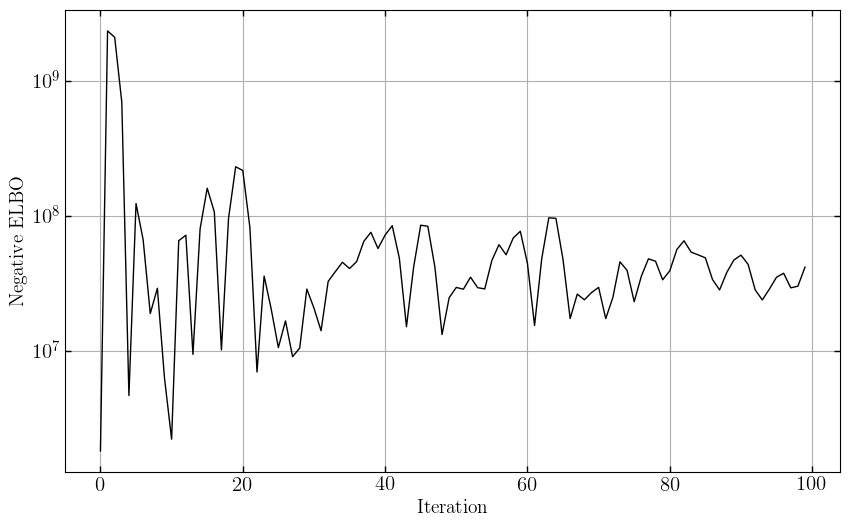

In [202]:
plt.figure(figsize=(10,6))
plt.plot(stream_bkg_svi_results.losses, lw=1)
# plt.ylim(3e6, 3.5e6) ; plt.xlim(40000,50000)
plt.yscale('log')
plt.xlabel('Iteration') ; plt.ylabel('Negative ELBO')
plt.grid()
plt.show()

In [203]:
MAP_p_expanded = get_svi_params(stream_bkg_mm, run_data, stream_bkg_svi_results, stream_bkg_guide, 
                                num_samples=1, key=jax.random.PRNGKey(42))

In [204]:
print(MAP_p_expanded['mixture-probs'])

[0.98658261 0.01341739]


In [184]:
stream_bkg_svi_results.params['mixture:modeldata_auto_loc'][:,6]

Array([0.53686518, 0.53984007, 0.53753834, ..., 0.52856939, 0.52556231,
       0.52680641], dtype=float64)

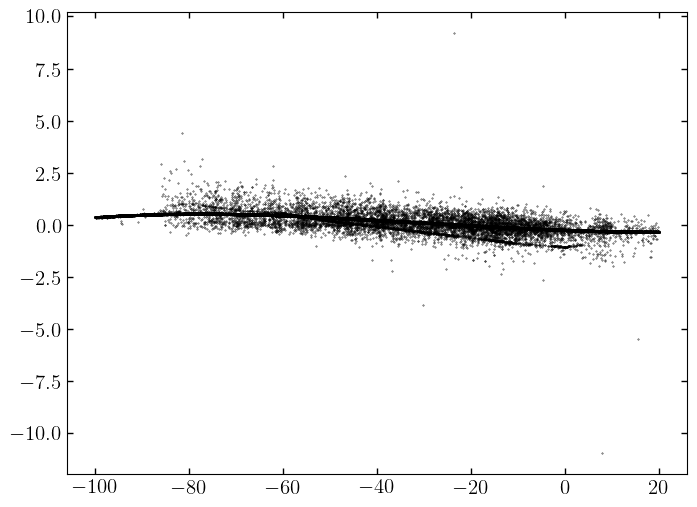

In [205]:
plt.scatter(run_data['phi1'], stream_bkg_svi_results.params['mixture:modeldata_auto_loc'][:,4], s=0.1)
plt.show()

(-100.0, 20.0)

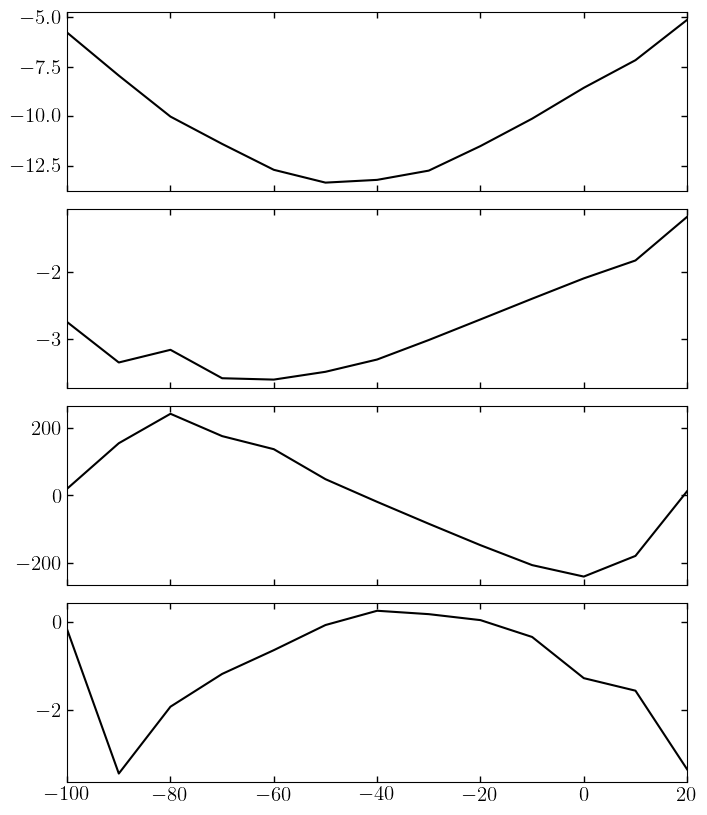

In [206]:
fig, [ax1, ax2, ax3, ax4] = plt.subplots(4,1,figsize=(8,10), sharex=True)
ax1.plot(stream_model_mm.coord_parameters['pm1']['knots'], MAP_p_expanded['stream']['pm1']['loc_vals'])
# ax1.plot(stream_model_mm.coord_parameters['pm1']['knots'], stream_params['pm1']['loc_vals'])

ax2.plot(stream_model_mm.coord_parameters['pm2']['knots'], MAP_p_expanded['stream']['pm2']['loc_vals'])
# ax2.plot(stream_model_mm.coord_parameters['pm2']['knots'], stream_params['pm2']['loc_vals'])

ax3.plot(stream_model_mm.coord_parameters['rv']['knots'], MAP_p_expanded['stream']['rv']['loc_vals'])
# ax3.plot(stream_model_mm.coord_parameters['rv']['knots'], stream_params['rv']['loc_vals'])

ax4.plot(stream_model_mm.coord_parameters['rv']['knots'], MAP_p_expanded['stream']['phi2']['loc_vals'])
# ax3.plot(stream_model_mm.coord_parameters['rv']['knots'], stream_params['rv']['loc_vals'])
ax3.set_xlim(-100,20)

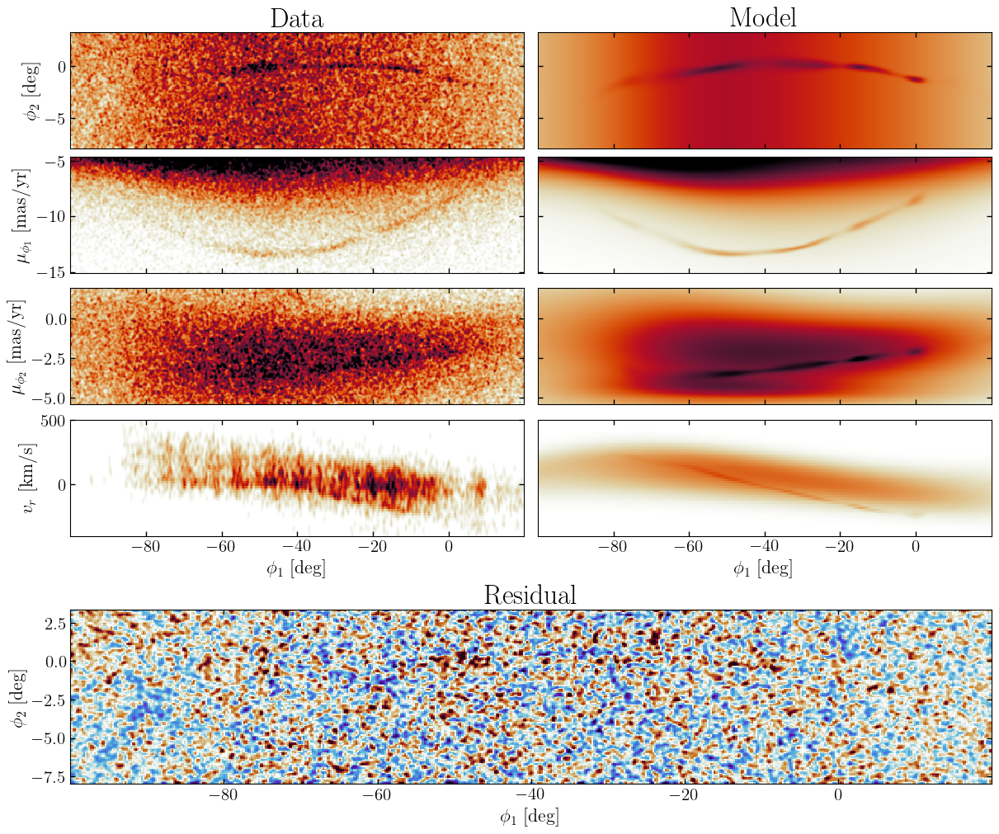

In [207]:
fig = plt.figure(figsize=(12, 10), constrained_layout=True)
gs = gridspec.GridSpec(5, 2, height_ratios=[1, 1, 1, 1, 1.5], figure=fig, hspace=0, wspace=0)

ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1], sharex=ax1, sharey=ax1)
ax3 = fig.add_subplot(gs[1, 0], sharex=ax1)
ax4 = fig.add_subplot(gs[1, 1], sharex=ax1, sharey=ax3)
ax5 = fig.add_subplot(gs[2, 0], sharex=ax1)
ax6 = fig.add_subplot(gs[2, 1], sharex=ax1, sharey=ax5)
ax7 = fig.add_subplot(gs[3, 0], sharex=ax1)
ax8 = fig.add_subplot(gs[3, 1], sharex=ax1, sharey=ax7)

ax9 = fig.add_subplot(gs[4, :], sharex=ax1)

plot_data_projections(
    data=run_data,
    grids=plot_grids,
    axes=ax3,
    coord_names=[('phi1', 'pm1')],
    pcolormesh_kwargs=dict(rasterized=True, vmax=5, vmin=0, cmap=cmap)
)
plot_data_projections(
    data=run_data,
    grids=plot_grids,
    axes=[ax1, ax5],
    pcolormesh_kwargs=dict(rasterized=True, vmax=3, vmin=0, cmap=cmap),
    coord_names=[('phi1', 'phi2'), ('phi1', 'pm2')]
)
plot_data_projections(
    data=only_rv_run_data,
    grids=plot_grids,
    axes=ax7,
    pcolormesh_kwargs=dict(rasterized=True, vmax=3, vmin=0, cmap=cmap),
    coord_names=[('phi1', 'rv')]
)

stream_bkg_mm.plot_model_projections(ndata=len(run_data_), grids=plot_grids, 
                          grid_coord_names=[('phi1', 'phi2'), ('phi1', 'pm1')],
                          pars=MAP_p_expanded, axes=[ax2,ax4], label=False,
                          pcolormesh_kwargs=dict(rasterized=True, vmax=5, vmin=0, cmap=cmap))
stream_bkg_mm.plot_model_projections(ndata=len(run_data_['rv'][run_data_['rv']!=0]), grids=plot_grids, grid_coord_names=[('phi1', 'phi2'), ('phi1', 'rv')],
                          pars=MAP_p_expanded, axes=[ax2,ax8], label=False,
                          pcolormesh_kwargs=dict(rasterized=True, vmax=3, vmin=0, cmap=cmap))
stream_bkg_mm.plot_model_projections(ndata=len(run_data_), grids=plot_grids, grid_coord_names=[('phi1', 'phi2'), ('phi1', 'pm2')],
                          pars=MAP_p_expanded, axes=[ax2,ax6], label=False,
                          pcolormesh_kwargs=dict(rasterized=True, vmax=3, vmin=0, cmap=cmap))

stream_bkg_mm.plot_residual_projections(
    grids=plot_grids, pars=MAP_p_expanded,
    data=run_data, axes=ax9, label=True, 
    pcolormesh_kwargs=dict(vmin=-1, vmax=1, rasterized=True, cmap=cmr.fusion),
    grid_coord_names=[('phi1', 'phi2')]
)

for ax in [ax1,ax2,ax3,ax4,ax5,ax6]:
    ax.label_outer()
ax8.yaxis.set_visible(False)
ax8.set_ylim(-400,500)

ax1.set_title('Data', fontsize=24)
ax2.set_title('Model', fontsize=24)
ax9.set_title('Residual', fontsize=24, pad=5)

# plt.savefig('../../paper_figures/full_model.pdf')
plt.show()

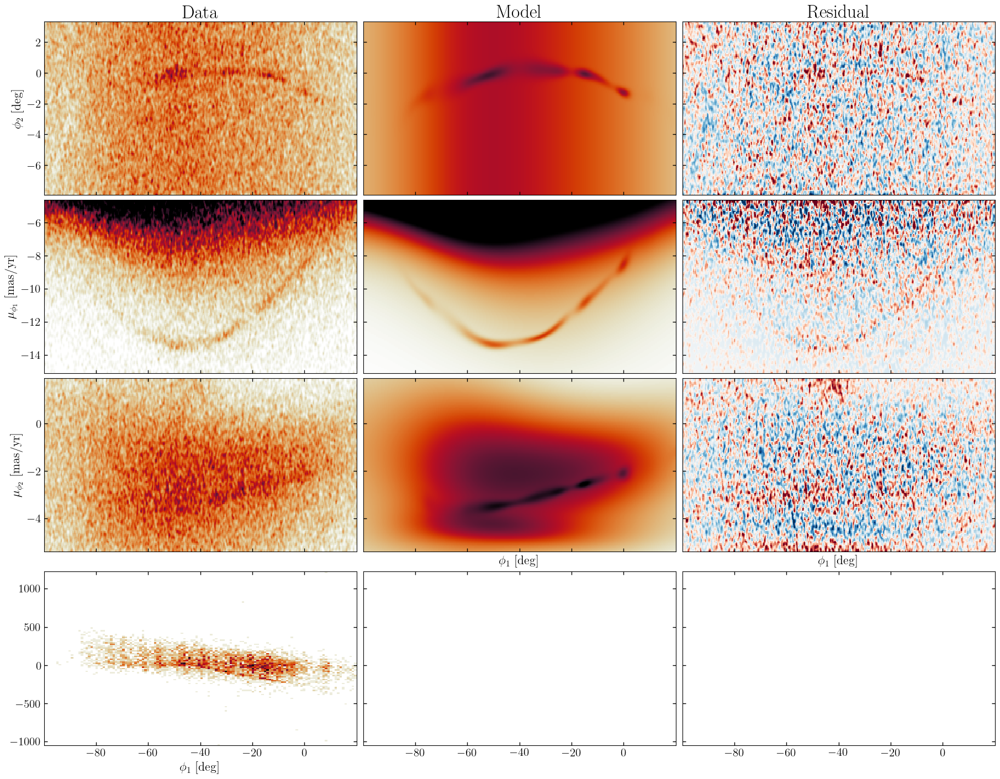

In [208]:
fig, axes = plt.subplots(
    len(stream_bkg_mm.coord_names) - 1,
    3,
    figsize=(18, 3.5 * (len(stream_bkg_mm.coord_names) - 1)),
    sharex=True,
    sharey="row",
    constrained_layout=True,
)

#axes = jnp.atleast_2d(axes)
plot_data_projections(
    data=run_data,
    grids=plot_grids,
    axes=axes[:, 0],
    coord_names=[('phi1','phi2'), ('phi1', 'pm1'), ('phi1', 'pm2')],
    pcolormesh_kwargs=dict(rasterized=True, vmax=5, vmin=0, cmap=cmap)
    # coord_names=GD1BackgroundModel.coord_names,
)
axes[3,0].hist2d(run_data_['phi1'][run_data_['rv'] != 0], run_data_['rv'][run_data_['rv'] != 0], bins=[128, 128], range=[[phi1_lim[0],phi1_lim[1]], [rv_lim[0],rv_lim[1]]], cmap=cmap)

stream_bkg_mm.plot_model_projections(ndata=len(run_data_), grids=plot_grids, pars=MAP_p_expanded, grid_coord_names=[('phi1','phi2'), ('phi1', 'pm1'), ('phi1', 'pm2')],
                          axes=axes[:3, 1], label=False,
                          pcolormesh_kwargs=dict(rasterized=True, vmax=3, vmin=0, cmap=cmap))
# mm.plot_model_projections(ndata=len(run_data_), grids=plot_grids, grid_coord_names=[('phi1','rv')],
#                           pars=MAP_p_expanded, axes=axes[3, 1], label=False,
#                           pcolormesh_kwargs=dict(rasterized=True, vmax=20, vmin=0, cmap=cmap))
stream_bkg_mm.plot_residual_projections(
    grids=plot_grids, pars=MAP_p_expanded, grid_coord_names=[('phi1','phi2'), ('phi1', 'pm1'), ('phi1', 'pm2')],
    data=run_data, axes=axes[:3, 2], label=False, 
    pcolormesh_kwargs=dict(vmin=-1, vmax=1, cmap='RdBu', rasterized=True)
)
axes[0][0].set_title('Data', fontsize=24)
axes[0][1].set_title('Model', fontsize=24)
axes[0][2].set_title('Residual', fontsize=24)

# plt.savefig('../figures/
plt.show()

In [193]:
stream_bkg_dict = {'svi_results': stream_bkg_svi_results,
            'guide': stream_bkg_guide,
            'params': MAP_p_expanded
           }
with open(stream_bkg_mm_filename, 'wb') as param_file:
    pickle.dump(stream_bkg_dict, param_file)

## Continuing Full Model

In [16]:
bkg_filename = svi_results_dir + 'bkg_{}_{}_{}_{}_auto_normal.pkl'.format(*bkg_knot_spacings)

with open(bkg_filename, 'rb') as input_file_:
    full_dict = pickle.load(input_file_)
    
bkg_svi_results = full_dict['svi_results']
bkg_guide = full_dict['guide']

stream_filename = svi_results_dir + 'stream_{}_{}_{}_{}_{}_auto_normal.pkl'.format(*stream_knot_spacings)

with open(stream_filename, 'rb') as input_file_:
    full_dict = pickle.load(input_file_)
    
stream_svi_results = full_dict['svi_results']
stream_guide = full_dict['guide']

with open(stream_bkg_mm_filename, 'rb') as input_file_:
    full_dict = pickle.load(input_file_)
    
stream_bkg_svi_results = full_dict['svi_results']
stream_bkg_guide = full_dict['guide']
stream_bkg_params = full_dict['params']

In [17]:
rv_min = jnp.min(stream_data['phi1'][stream_data_err['rv'] !=1e4])
rv_max = jnp.max(stream_data['phi1'][stream_data_err['rv'] !=1e4])

In [18]:
rv_min, rv_max

(Array(-82.29245517, dtype=float64), Array(2.60476657, dtype=float64))

In [19]:
bkg_model_mm = init_stream.make_bkg_model_component(knot_spacings=bkg_knot_spacings, n_mixture=2, 
                                                    coord_bounds=coord_bounds, data=run_data)
stream_model_mm = init_stream.make_stream_model_component(knot_spacings=stream_knot_spacings, 
                                                          coord_bounds=coord_bounds, data=run_data, rv_min=rv_min, rv_max=rv_max)
stream_bkg_mm = ComponentMixtureModel(dist.Dirichlet(jnp.array([1.0, 1.0])), 
                                          components=[bkg_model_mm, stream_model_mm])

bkg_params = get_svi_params(model=bkg_model_mm, data=run_data, svi_results=bkg_svi_results, 
                            guide=bkg_guide, num_samples=1, key=jax.random.PRNGKey(12345))

stream_params = get_svi_params(model=stream_model_mm, data=run_data, svi_results=stream_svi_results, 
                            guide=stream_guide, num_samples=1, key=jax.random.PRNGKey(12345))

In [20]:
# make offtrack model
# offtrack_dx=[3,1]
offtrack_phi1_dx, offtrack_phi2_dx = offtrack_dx

phi1_lim = coord_bounds['phi1']
phi2_lim = coord_bounds['phi2']

offtrack_phi12_locs = jnp.stack(
jnp.meshgrid(
    jnp.arange(phi1_lim[0]+offtrack_phi1_dx, 
               phi1_lim[1]-offtrack_phi1_dx/2 + 1e-3, #factor of two added by hand to make sure the high phi1 edge is properly included
               offtrack_phi1_dx),
    jnp.arange(phi2_lim[0]+offtrack_phi2_dx, 
               phi2_lim[1]-offtrack_phi2_dx/2 + 1e-3, 
               offtrack_phi2_dx),
),
axis=-1,
).reshape(-1, 2)

_init_prob = jnp.ones(len(offtrack_phi12_locs))
_init_prob /= _init_prob.sum()

# Remove nodes in areas we don't have data:
# offtrack_node_mask = np.ones(offtrack_phi12_locs.shape[0], dtype=bool)

# _interp_dict = init_stream.interpolate_stream_tracks(stream_data, phi1_lim)
# offtrack_node_mask &= offtrack_phi12_locs[:, 1] < _interp_dict['phi2'](offtrack_phi12_locs[:,0])+2.5
# offtrack_node_mask &= offtrack_phi12_locs[:, 1] > _interp_dict['phi2'](offtrack_phi12_locs[:,0])-2.5
# offtrack_node_mask &= offtrack_phi12_locs[:, 0] < -10
# offtrack_node_mask &= offtrack_phi12_locs[:, 0] > -45

# offtrack_phi12_locs = offtrack_phi12_locs[offtrack_node_mask]

# offtrack_model = ModelComponent(
#         name="offtrack",
#         coord_distributions={
#             ("phi1", "phi2"): IndependentGMM,
#             "pm1": stream_model_mm.coord_distributions["pm1"],
#             "pm2": stream_model_mm.coord_distributions["pm2"],
#             "rv": stream_model_mm.coord_distributions["rv"],
#         },
#         coord_parameters={
#             ("phi1", "phi2"): {
#                 "mixing_distribution": (
#                     dist.Categorical,
#                     dist.Dirichlet(jnp.full(offtrack_phi12_locs.shape[0], 1)),
#                 ),
#                 "locs": offtrack_phi12_locs.T,
#                 "scales":
#                     # dist.HalfNormal(jnp.array([offtrack_phi1_dx, offtrack_phi2_dx])[:, None]).expand(offtrack_phi12_locs.T.shape), 
#                     dist.TruncatedNormal(loc=jnp.array(offtrack_dx)[:, None], scale=jnp.array(offtrack_dx)[:, None], 
#                                          low=0.1*jnp.array(offtrack_dx)[:, None]).expand(offtrack_phi12_locs.T.shape),
#                 "low": jnp.array([phi1_lim[0], phi2_lim[0]])[:, None],
#                 "high": jnp.array([phi1_lim[1], phi2_lim[1]])[:, None],
#             },
#             # We don't need to define the parameters here, as they are the same as for the
#             # stream model - this will be handled below when we combine the components into
#             # a mixture model
#             "pm1": stream_model_mm.coord_parameters["pm1"],
#             "pm2": stream_model_mm.coord_parameters["pm2"],
#             "rv": stream_model_mm.coord_parameters["rv"],
#         },
#         conditional_data={"pm1": {"x": "phi1"}, "pm2": {"x": "phi1"}, "rv": {"x": "phi1"}},
#     )

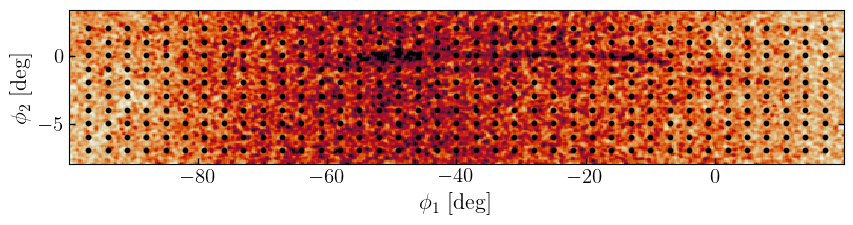

In [21]:
fig, ax = plt.subplots(1,1,figsize=(10,2))

plot_data_projections(
    data=run_data,
    grids=plot_grids,
    axes=ax,
    pcolormesh_kwargs=dict(rasterized=True, vmax=3, vmin=0, cmap=cmap),
    coord_names=[('phi1', 'phi2')]
)
ax.scatter(offtrack_phi12_locs[:,0],offtrack_phi12_locs[:,1], s=10)
plt.show()

In [22]:
offtrack_model, offtrack_phi12_locs = init_stream.make_offtrack_model_component(offtrack_dx, stream_model_mm, 
                                                                                coord_bounds)
offtrack_model.coord_parameters['pm1']['loc_vals'] = dist.TruncatedNormal(
    loc=previous_params['stream']['pm1']['loc_vals'],
    scale=0.1,
    low=previous_params['stream']['pm1']['loc_vals']-0.5,
    high=previous_params['stream']['pm1']['loc_vals']+0.5
    )
offtrack_model.coord_parameters['pm2']['loc_vals'] = dist.TruncatedNormal(
    loc=previous_params['stream']['pm2']['loc_vals'],
    scale=0.1,
    low=previous_params['stream']['pm2']['loc_vals']-0.5,
    high=previous_params['stream']['pm2']['loc_vals']+0.5)
offtrack_model.coord_parameters['rv']['loc_vals'] = dist.TruncatedNormal(
    loc=stream_params['rv']['loc_vals'],
    scale=5,
    low=stream_params['rv']['loc_vals']-20,
    high=stream_params['rv']['loc_vals']+20)

offtrack_model.coord_parameters['pm1']['scale_vals'] = dist.TruncatedNormal(
    loc=previous_params['stream']['pm1']['scale_vals'],
    scale=previous_params['stream']['pm1']['scale_vals'] / 3,
    low=0.00278, high=2*previous_params['stream']['pm1']['scale_vals'])
offtrack_model.coord_parameters['pm2']['scale_vals'] = dist.TruncatedNormal(
    loc=previous_params['stream']['pm2']['scale_vals'],
    scale=previous_params['stream']['pm2']['scale_vals'] / 3,
    low=0.00278, high=2*previous_params['stream']['pm2']['scale_vals'])
offtrack_model.coord_parameters['rv']['scale_vals'] = dist.TruncatedNormal(
    loc=stream_params['rv']['scale_vals'],
    scale=stream_params['rv']['scale_vals'] / 3,
    low=0.1, high=2*stream_params['rv']['scale_vals'])
offtrack_model.coord_parameters['pm1']['x'] = run_data['phi1']
offtrack_model.coord_parameters['pm2']['x'] = run_data['phi1']
offtrack_model.coord_parameters['rv']['x'] = run_data['phi1']


mm = ComponentMixtureModel(
    dist.Dirichlet(jnp.array([1, 1, 1])), #close to real solution
    components=[bkg_model_mm, stream_model_mm, offtrack_model],
)

In [23]:
previous_params = get_svi_params(mm, run_data, previous_svi_results, previous_guide, num_samples=1, key=jax.random.PRNGKey(42))
bkg_params = get_svi_params(mm['background'], run_data, bkg_svi_results, bkg_guide, num_samples=100, key=jax.random.PRNGKey(42))
stream_params = get_svi_params(mm['stream'], run_data, stream_svi_results, stream_guide, num_samples=100, key=jax.random.PRNGKey(42))

In [24]:
offtrack_init_params = {
    ("phi1", "phi2"): {
        "mixing_distribution": _init_prob,
        "scales": jnp.array([offtrack_dx] * len(offtrack_phi12_locs)).T,
    },
    "pm1": previous_params['stream']['pm1'],
    "pm2": previous_params['stream']['pm2'],
    "rv": previous_params['stream']['rv'],
}
background_init_params = bkg_params
    
offtrack_packed_params = mm.pack_params({'offtrack': offtrack_init_params})

In [25]:
# init_params = {key: value for key, value in no_off_svi_results.params.items() if (("background" in key) or ("stream" in key))}
# init_params = {key: value for key, value in previous_svi_results.params.items() if not (("offtrack" in key) or ('mixture-probs' in key))}#stream_bkg_params
# init_params = {key: value for key, value in previous_svi_results.params.items() if not  ('mixture-probs' in key)}
init_params = previous_svi_results.params
# del init_params['stream:rv:loc_vals_auto_loc']
# del init_params['stream:rv:loc_vals_auto_scale']
# del init_params['stream:rv:scale_vals_auto_loc']
# del init_params['stream:rv:scale_vals_auto_scale']

# del init_params['offtrack:rv:loc_vals_auto_loc']
# del init_params['offtrack:rv:loc_vals_auto_scale']
# del init_params['offtrack:rv:scale_vals_auto_loc']
# del init_params['offtrack:rv:scale_vals_auto_scale']
# init_params = mm.pack_params({'background': bkg_params,
#                               'stream': stream_params,
#                               'offtrack': offtrack_init_params
#                              })
# init_params = bkg_svi_results.params | stream_svi_results.params | offtrack_packed_params
# del init_params['background:pm1:modeldata_auto_loc']
# del init_params['stream:pm1:modeldata_auto_loc']
# del init_params['background:pm2:modeldata_auto_loc']
# del init_params['stream:pm2:modeldata_auto_loc']
# del init_params['background:rv:modeldata_auto_loc']
# del init_params['stream:rv:modeldata_auto_loc']
# del init_params['background:pm1:modeldata_auto_scale']
# del init_params['stream:pm1:modeldata_auto_scale']
# del init_params['background:pm2:modeldata_auto_scale']
# del init_params['stream:pm2:modeldata_auto_scale']
# del init_params['background:rv:modeldata_auto_scale']
# del init_params['stream:rv:modeldata_auto_scale']


# foff = 0.0012
# fstream=0.013
# fbkg = 1-fstream-foff


# init_params['mixture-probs'] = jnp.array([fbkg,fstream,foff])

# init_params['mixture:modeldata_auto_loc'] = previous_svi_results.params['mixture:modeldata_auto_loc']
# init_params['mixture:modeldata_auto_scale'] = previous_svi_results.params['mixture:modeldata_auto_scale']

In [189]:
init_params['background:phi1:mixing_distribution'] *= 1/jnp.sum(init_params['background:phi1:mixing_distribution'])
init_params['stream:phi1:mixing_distribution'] *= 1/jnp.sum(init_params['stream:phi1:mixing_distribution'])
# init_params['mixture-probs'] *= 1/jnp.sum(init_params['mixture-probs'])
# init_params['offtrack:phi1-phi2:mixing_distribution'] *= 1/jnp.sum(init_params['offtrack:phi1-phi2:mixing_distribution'])

In [433]:
init_params = svi_results.params

In [434]:
init_params['mixture-probs_auto_loc'] = previous_svi_results.params['mixture-probs_auto_loc']
init_params['mixture-probs_auto_scale'] = previous_svi_results.params['mixture-probs_auto_scale']
init_params['offtrack:phi1-phi2:mixing_distribution_auto_loc'] = previous_svi_results.params['offtrack:phi1-phi2:mixing_distribution_auto_loc']
init_params['offtrack:phi1-phi2:mixing_distribution_auto_scale'] = previous_svi_results.params['offtrack:phi1-phi2:mixing_distribution_auto_scale']
init_params['offtrack:phi1-phi2:scales_auto_loc'] = previous_svi_results.params['offtrack:phi1-phi2:scales_auto_loc']
init_params['offtrack:phi1-phi2:scales_auto_scale'] = previous_svi_results.params['offtrack:phi1-phi2:scales_auto_scale']

In [26]:
frozen_params = {#'mixture:modeldata_auto_loc', 'mixture:modeldata_auto_scale',
                 #'mixture-probs_auto_loc',
                 # 'background:phi1:mixing_distribution_auto_loc', 'background:phi1:mixing_distribution_auto_scale', 
                 # 'background:phi1:scales_auto_loc', 'background:phi1:scales_auto_scale', 
                 # 'background:pm1:loc_vals_auto_loc', 'background:pm1:loc_vals_auto_scale', 
                 # 'background:pm1:mixing_distribution_auto_loc', 'background:pm1:mixing_distribution_auto_scale', 
                 # 'background:pm1:scale_vals_auto_loc', 'background:pm1:scale_vals_auto_scale', 
                 # 'background:pm2:loc_vals_auto_loc', 'background:pm2:loc_vals_auto_scale', 
                 # 'background:pm2:mixing_distribution_auto_loc', 'background:pm2:mixing_distribution_auto_scale', 
                 # 'background:pm2:scale_vals_auto_loc', 'background:pm2:scale_vals_auto_scale', 
                 # 'background:rv:loc_vals_auto_loc', 'background:rv:loc_vals_auto_scale', 
                 # 'background:rv:mixing_distribution_auto_loc', 'background:rv:mixing_distribution_auto_scale', 
                 # 'background:rv:scale_vals_auto_loc', 'background:rv:scale_vals_auto_scale',
                 # 'stream:phi1:mixing_distribution_auto_loc', 'stream:phi1:mixing_distribution_auto_scale', 
                 # 'stream:phi1:scales_auto_loc', 'stream:phi1:scales_auto_scale', 
                 # 'stream:phi2:loc_vals_auto_loc', 'stream:phi2:loc_vals_auto_scale', 
                 # 'stream:phi2:scale_vals_auto_loc', 'stream:phi2:scale_vals_auto_scale', 
                 # 'stream:pm1:loc_vals_auto_loc', 'stream:pm1:loc_vals_auto_scale', 
                 # 'stream:pm1:scale_vals_auto_loc', 'stream:pm1:scale_vals_auto_scale', 
                 # 'stream:pm2:loc_vals_auto_loc', 'stream:pm2:loc_vals_auto_scale', 
                 # 'stream:pm2:scale_vals_auto_loc', 'stream:pm2:scale_vals_auto_scale', 
                 # 'stream:rv:loc_vals_auto_loc', 'stream:rv:loc_vals_auto_scale', 
                 # 'stream:rv:scale_vals_auto_loc', 'stream:rv:scale_vals_auto_scale',
                 # 'offtrack:pm1:loc_vals_auto_loc', 'offtrack:pm1:loc_vals_auto_scale', 
                 # 'offtrack:pm1:scale_vals_auto_loc', 'offtrack:pm1:scale_vals_auto_scale', 
                 # 'offtrack:pm2:loc_vals_auto_loc', 'offtrack:pm2:loc_vals_auto_scale', 
                 # 'offtrack:pm2:scale_vals_auto_loc', 'offtrack:pm2:scale_vals_auto_scale', 
                 # 'offtrack:rv:loc_vals_auto_loc', 'offtrack:rv:loc_vals_auto_scale', 
                 # 'offtrack:rv:scale_vals_auto_loc', 'offtrack:rv:scale_vals_auto_scale',
                 # 'offtrack:phi1-phi2:mixing_distribution_auto_loc', 'offtrack:phi1-phi2:mixing_distribution_auto_scale',
                 # 'offtrack:phi1-phi2:scales_auto_loc', 'offtrack:phi1-phi2:scales_auto_scale'
                }

In [27]:
# Parameter grouping
def full_param_labels(param_tree):
    """
    Assign labels to parameters based on whether they should be frozen or trainable.
    """
    labels = {}
    for key in param_tree.keys():
        labels[key] = "frozen" if key in frozen_params else "trainable"
    return labels

In [28]:
keys=jax.random.split(jax.random.PRNGKey(123), num=2)
init_lr = 1e-1
num_steps = 10_000

# Define step intervals
eighth_steps = num_steps // 8
quarter_steps = num_steps // 4
half_steps = num_steps // 2

lr_schedule = optax.join_schedules(
        schedules=[
            # optax.constant_schedule(init_lr),
            optax.cosine_decay_schedule(init_value=init_lr, decay_steps=2_500, alpha=1e-1),
            optax.cosine_decay_schedule(init_value=init_lr, decay_steps=5_000, alpha=1e-1),
            optax.cosine_decay_schedule(init_value=init_lr/10, decay_steps=15_000, alpha=1e-1),
            optax.cosine_decay_schedule(init_value=init_lr/100, decay_steps=15_000, alpha=1e-1),
        ],
        boundaries=[2_500, 
                    7_500,
                    22_500,
                   ]
    )


# Define optimizers for frozen and trainable parameters
frozen_optimizer = optax.set_to_zero()  # No updates for frozen parameters
trainable_optimizer = optax.chain(optax.clip(10.),
                                optax.adam(learning_rate=lr_schedule)
                                )
# trainable_optimizer = optax.chain(optax.clip(10.),
#                                 optax.adam(learning_rate=2e-4)
#                                 )


# # Combine with `optax.masked`
# masked_optimizer = optax.chain(optax.clip(10.),
#                                optax.masked(optax.adam(learning_rate=lr_schedule), mask_fn),  # Mask updates for frozen parameters
#                                optax.set_to_zero()  # Explicitly zero out gradients for masked parameters
# )
# Combine optimizers using multi_transform
full_masked_optimizer = optax.multi_transform(
    {
        "frozen": frozen_optimizer,
        "trainable": trainable_optimizer,
    },
    full_param_labels
)

# Convert to NumPyro optimizer
full_optimizer = numpyro.optim.optax_to_numpyro(full_masked_optimizer)

full_guide = AutoNormal(
        mm, init_loc_fn=numpyro.infer.init_to_value(values=init_params)
    )
svi = SVI(mm, full_guide, full_optimizer, Trace_ELBO(num_particles=3))
with numpyro.validation_enabled(), jax.debug_nans():
    # Initialize and run the SVI optimization
    init_state = svi.init(keys[0], init_params=init_params, data=run_data, err=run_data_err)
    print(svi.evaluate(init_state, data=run_data, err=run_data_err))

1757520.616277571


In [30]:
pars_0 = svi.get_params(init_state)

pred_dist = Predictive(full_guide, params=pars_0, num_samples=100)
pars_ = pred_dist(keys[0], data=run_data)
pars = {k: jnp.median(v, axis=0) for k, v in pars_.items() if (k != '_auto_latent' and (not 'modeldata' in k))}
MAP_p_expanded = mm.expand_numpyro_params(pars)

In [34]:
svi_results = svi.run(
        rng_key=keys[1], num_steps=37_500, init_state=init_state,#svi_results.state, 
        data=run_data, err=run_data_err
    )

100%|█████████████████████████████████████████████████████████████████████████████████| 37500/37500 [14:21:53<00:00,  1.38s/it, init loss: 1757520.6163, avg. loss [35626-37500]: 2908957.1579]


In [35]:
svi_results = svi.run(
            rng_key=keys[1], num_steps=10_000, init_state=svi_results.state, 
            data=run_data, err=run_data_err
        )

100%|███████████████████████████████████████████████████████████████████████████████████| 10000/10000 [3:50:10<00:00,  1.38s/it, init loss: 2683166.8661, avg. loss [9501-10000]: 2662334.7157]


In [38]:
pred_dist = Predictive(full_guide, params=svi_results.params, num_samples=1)
pars1 = pred_dist(rng_key=jax.random.PRNGKey(123), data=run_data)
pars1 = {k: v[0] for k, v, in pars1.items()}

pred_dist = Predictive(full_guide, params=init_params, num_samples=1)
pars2 = pred_dist(rng_key=jax.random.PRNGKey(123), data=run_data)
pars2 = {k: v[0] for k, v, in pars2.items()}

logprob, _ = numpyro.infer.util.log_density(mm, model_args=(), model_kwargs={'data': run_data, 'err':run_data_err}, params=pars1)
logprob2, _ = numpyro.infer.util.log_density(mm, model_args=(), model_kwargs={'data': run_data, 'err':run_data_err}, params=pars2)
logprob, logprob2

(Array(-1805433.91226797, dtype=float64),
 Array(-896418.04012026, dtype=float64))

2661117.23232928


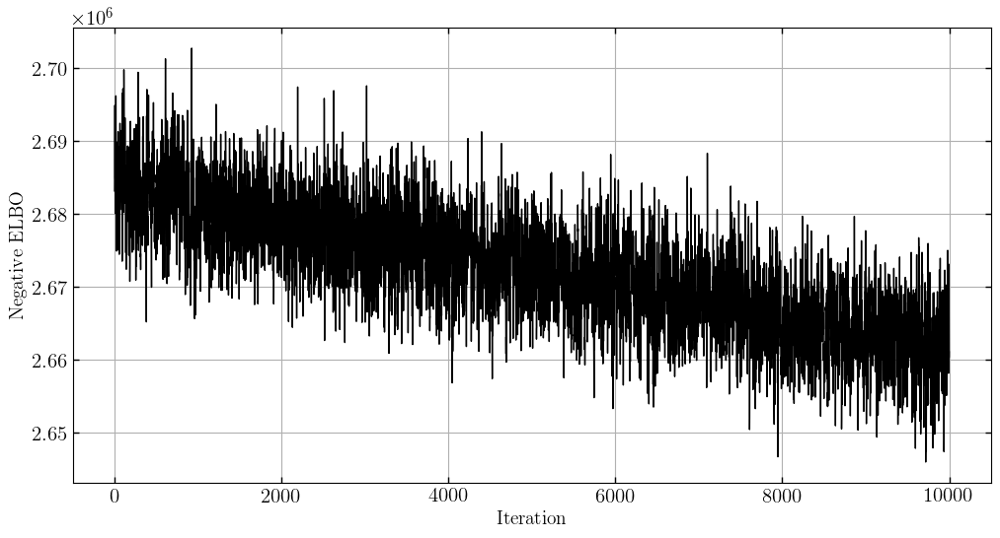

In [37]:
plt.figure(figsize=(12,6))
plt.plot(svi_results.losses, lw=1)
# plt.ylim(1.74e6, 1.795e6)
print(svi_results.losses[-1])
# plt.yscale('log')
plt.xlabel('Iteration') ; plt.ylabel('Negative ELBO')
plt.grid()
plt.show()

In [457]:
MAP_p_expanded = get_svi_params(mm, run_data, svi_results, full_guide, num_samples=100, key=jax.random.PRNGKey(42))

In [31]:
print(MAP_p_expanded['mixture-probs'])

[0.98382382 0.01506142 0.0011313 ]


In [411]:
specifications = jnp.concatenate([bkg_knot_spacings, stream_knot_spacings, np.array(offtrack_dx)])
filename = svi_results_dir + 'full_mm_bkg{}_{}_{}_{}_stream{}_{}_{}_{}_{}_off{}_{}_auto_normal2.pkl'.format(*specifications)
print(filename)

/Users/Tavangar/Work/gd1-dr3/svi_results/full_mm_bkg40_40_40_40_stream5_10_10_10_10_off3_1_auto_normal2.pkl


In [412]:
results = {'svi_results': svi_results,
           'guide': full_guide,
           'params': MAP_p_expanded}
    
with open(filename, 'wb') as param_file:
    pickle.dump(results, param_file)

(-100.0, 20.0)

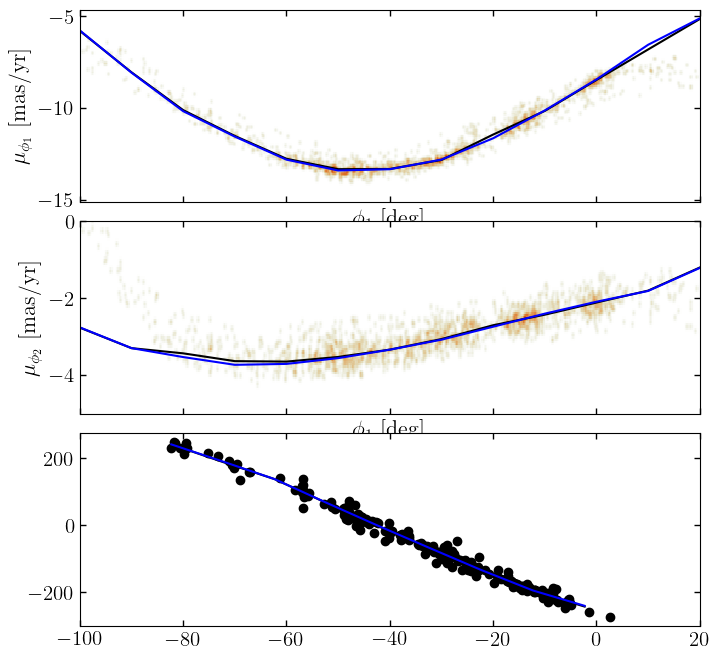

In [32]:
fig, [ax1, ax2, ax3] = plt.subplots(3,1,figsize=(8,8), sharex=True)
ax1.plot(mm['stream'].coord_parameters['pm1']['knots'], MAP_p_expanded['offtrack']['pm1']['loc_vals'])
ax1.plot(mm['stream'].coord_parameters['pm1']['knots'], MAP_p_expanded['stream']['pm1']['loc_vals'])
plot_data_projections(
    data=stream_data,
    grids=plot_grids,
    axes=ax1,
    pcolormesh_kwargs=dict(rasterized=True, vmax=3, vmin=0, cmap=cmap),
    coord_names=[('phi1', 'pm1')]
)
# ax1.plot(stream_model_mm.coord_parameters['pm1']['knots'], stream_params['pm1']['loc_vals'])

ax2.plot(mm['stream'].coord_parameters['pm2']['knots'], MAP_p_expanded['offtrack']['pm2']['loc_vals'])
ax2.plot(mm['stream'].coord_parameters['pm2']['knots'], MAP_p_expanded['stream']['pm2']['loc_vals'])
plot_data_projections(
    data=stream_data,
    grids=plot_grids,
    axes=ax2,
    pcolormesh_kwargs=dict(rasterized=True, vmax=3, vmin=0, cmap=cmap),
    coord_names=[('phi1', 'pm2')]
)
ax2.set_ylim(-5,0)
# ax2.plot(stream_model_mm.coord_parameters['pm2']['knots'], stream_params['pm2']['loc_vals'])

ax3.plot(mm['stream'].coord_parameters['rv']['knots'], MAP_p_expanded['offtrack']['rv']['loc_vals'])
ax3.plot(mm['stream'].coord_parameters['rv']['knots'], MAP_p_expanded['stream']['rv']['loc_vals'])
ax3.scatter(stream_data['phi1'][stream_data_err['rv']!=1e4], stream_data['rv'][stream_data_err['rv']!=1e4])
# ax3.plot(stream_model_mm.coord_parameters['rv']['knots'], stream_params['rv']['loc_vals'])
ax3.set_xlim(-100,20)

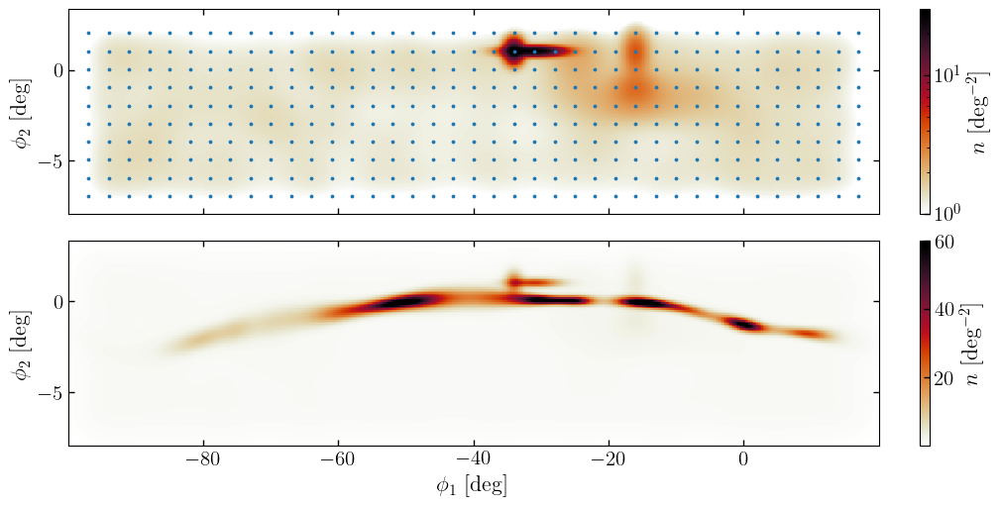

In [33]:
str_off_mm = ComponentMixtureModel(
    dist.Dirichlet(jnp.array([1.0, 1.0])),
    components=[stream_model_mm, offtrack_model],
    # tied_coordinates={"offtrack": {"pm1": "stream", "pm2": "stream"}},
    )

str_off_mm_params = {
    "stream": MAP_p_expanded["stream"],
    "offtrack": MAP_p_expanded["offtrack"],
    "mixture-probs": MAP_p_expanded["mixture-probs"][1:]
}

bin_area = jnp.diff(plot_grids['phi1'])[0] * jnp.diff(plot_grids['phi2'])[0]

fig, [ax1, ax2] = plt.subplots(2,1,figsize=(10,5), sharex=True, constrained_layout=True)
_, _, pcms1 = mm['offtrack'].plot_model_projections(ndata=len(run_data_), 
                                                    grids=plot_grids, pars=MAP_p_expanded['offtrack'], grid_coord_names=[('phi1', 'phi2')], 
                                                    axes=ax1, pcolormesh_kwargs=dict(rasterized=True, cmap=cmap, 
                                                                                     norm=mpl.colors.LogNorm(vmin=1, vmax=30)))
ax1.scatter(mm['offtrack'].coord_parameters[('phi1','phi2')]['locs'][0], 
            mm['offtrack'].coord_parameters[('phi1','phi2')]['locs'][1], color="tab:blue", s=3)
cbar1 = fig.colorbar(pcms1[0], ax=ax1)#, ticks=jnp.array([0, 0.2, .4, .6, .8])*bin_area, pad=0.02,
           # format=mticker.FixedFormatter(['0', '0.2', '0.4', '0.6', '0.8']))

# _, _, pcms2 = str_off_mm.plot_model_projections(ndata=len(run_data_) * jnp.sum(MAP_p_expanded["mixture-probs"][1:]),
#                                                 pars=str_off_mm_packed_params, grids=plot_grids, grid_coord_names=[('phi1', 'phi2')], axes=ax2, label=True,
#                                                 pcolormesh_kwargs=dict(rasterized=True, vmax=0.9, vmin=0, cmap=cmap))
# cbar2 = fig.colorbar(pcms2[0], ax=ax2, ticks=jnp.array([0, 10, 20, 30, 40, 50])*bin_area, pad=0.02,
#            format=mticker.FixedFormatter(['0', '10', '20', '30', '40', '50']), extend='max')

_, _, pcms2 = mm['stream'].plot_model_projections(ndata=len(run_data_),
                                                pars=MAP_p_expanded['stream'], grids=plot_grids, grid_coord_names=[('phi1', 'phi2')], axes=ax2, label=True,
                                                pcolormesh_kwargs=dict(rasterized=True, cmap=cmap))
im2 = plt.pcolormesh(plot_grids['phi1'], plot_grids['phi2'], pcms2[0].get_array()+pcms1[0].get_array(), 
                     rasterized=True, cmap=cmap, vmax=60)
cbar2 = fig.colorbar(im2, ax=ax2)




ax1.set_xlabel("")
cbar1.set_label(label=r'$n$ [deg$^{-2}$]', fontsize=16)
cbar2.set_label(label=r'$n$ [deg$^{-2}$]', fontsize=16)


# plt.savefig('../../paper_figures/offtrack_model.pdf')
# plt.savefig('../../paper_figures/offtrack_model.png')
plt.show()

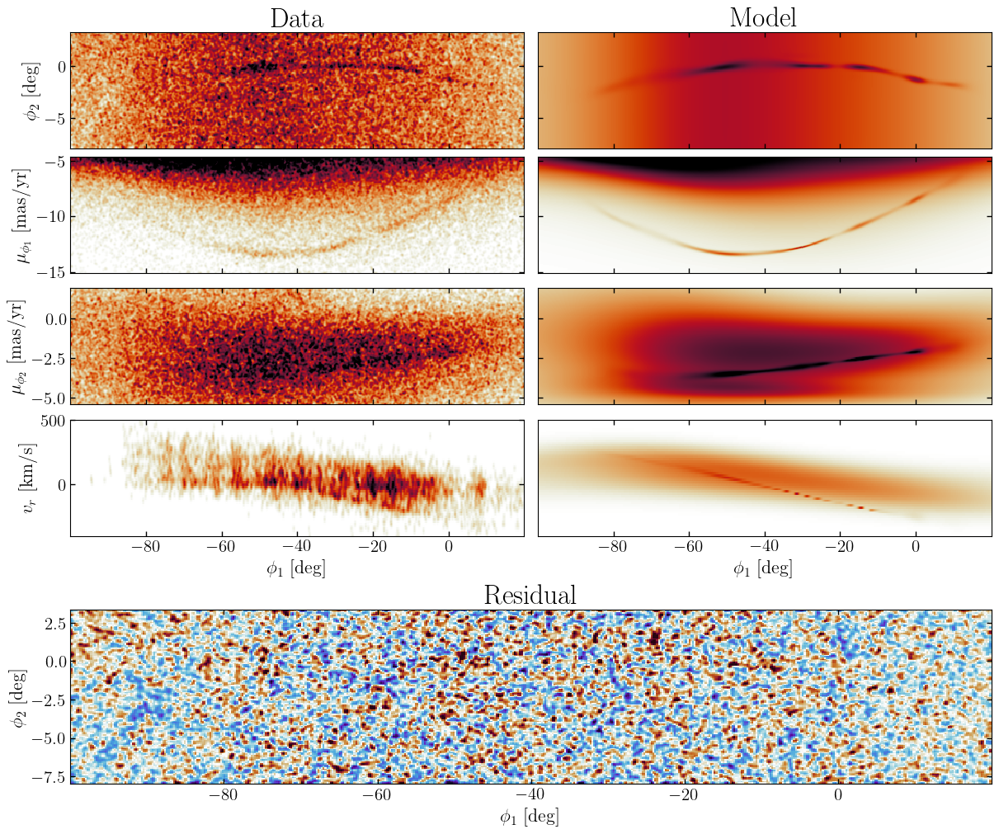

In [461]:
fig = plt.figure(figsize=(12, 10), constrained_layout=True)
gs = gridspec.GridSpec(5, 2, height_ratios=[1, 1, 1, 1, 1.5], figure=fig, hspace=0, wspace=0)

ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1], sharex=ax1, sharey=ax1)
ax3 = fig.add_subplot(gs[1, 0], sharex=ax1)
ax4 = fig.add_subplot(gs[1, 1], sharex=ax1, sharey=ax3)
ax5 = fig.add_subplot(gs[2, 0], sharex=ax1)
ax6 = fig.add_subplot(gs[2, 1], sharex=ax1, sharey=ax5)
ax7 = fig.add_subplot(gs[3, 0], sharex=ax1)
ax8 = fig.add_subplot(gs[3, 1], sharex=ax1, sharey=ax7)

ax9 = fig.add_subplot(gs[4, :], sharex=ax1)

plot_data_projections(
    data=run_data,
    grids=plot_grids,
    axes=ax3,
    coord_names=[('phi1', 'pm1')],
    pcolormesh_kwargs=dict(rasterized=True, vmax=5, vmin=0, cmap=cmap)
)
plot_data_projections(
    data=run_data,
    grids=plot_grids,
    axes=[ax1, ax5],
    pcolormesh_kwargs=dict(rasterized=True, vmax=3, vmin=0, cmap=cmap),
    coord_names=[('phi1', 'phi2'), ('phi1', 'pm2')]
)
plot_data_projections(
    data=only_rv_run_data,
    grids=plot_grids,
    axes=ax7,
    pcolormesh_kwargs=dict(rasterized=True, vmax=3, vmin=0, cmap=cmap),
    coord_names=[('phi1', 'rv')]
)

mm.plot_model_projections(ndata=len(run_data_), grids=plot_grids, 
                          grid_coord_names=[('phi1', 'phi2'), ('phi1', 'pm1')],
                          pars=MAP_p_expanded, axes=[ax2,ax4], label=False,
                          pcolormesh_kwargs=dict(rasterized=True, vmax=5, vmin=0, cmap=cmap))
mm.plot_model_projections(ndata=len(run_data_['rv'][run_data_['rv']!=0]), grids=plot_grids, grid_coord_names=[('phi1', 'phi2'), ('phi1', 'rv')],
                          pars=MAP_p_expanded, axes=[ax2,ax8], label=False,
                          pcolormesh_kwargs=dict(rasterized=True, vmax=3, vmin=0, cmap=cmap))
mm.plot_model_projections(ndata=len(run_data_), grids=plot_grids, grid_coord_names=[('phi1', 'phi2'), ('phi1', 'pm2')],
                          pars=MAP_p_expanded, axes=[ax2,ax6], label=False,
                          pcolormesh_kwargs=dict(rasterized=True, vmax=3, vmin=0, cmap=cmap))

mm.plot_residual_projections(
    grids=plot_grids, pars=MAP_p_expanded,
    data=run_data, axes=ax9, label=True, 
    pcolormesh_kwargs=dict(vmin=-1, vmax=1, rasterized=True, cmap=cmr.fusion),
    grid_coord_names=[('phi1', 'phi2')]
)

for ax in [ax1,ax2,ax3,ax4,ax5,ax6]:
    ax.label_outer()
ax8.yaxis.set_visible(False)
ax8.set_ylim(-400,500)

ax1.set_title('Data', fontsize=24)
ax2.set_title('Model', fontsize=24)
ax9.set_title('Residual', fontsize=24, pad=5)

# plt.savefig('../../paper_figures/full_model.pdf')
plt.show()

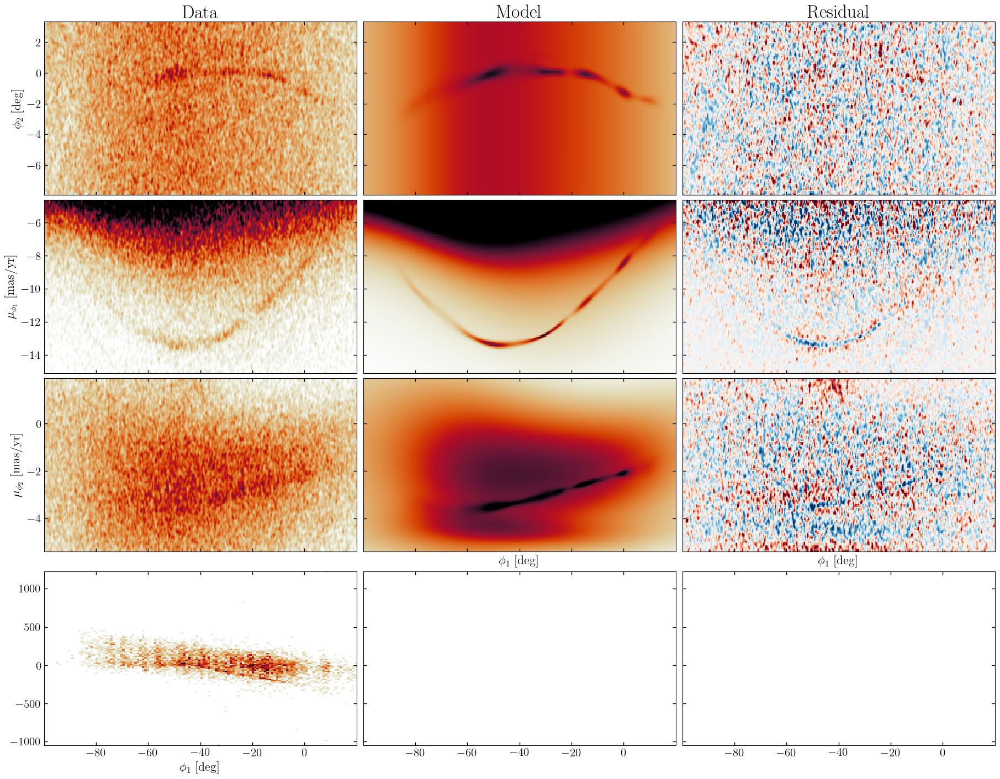

In [462]:
fig, axes = plt.subplots(
    len(mm.coord_names) - 1,
    3,
    figsize=(18, 3.5 * (len(mm.coord_names) - 1)),
    sharex=True,
    sharey="row",
    constrained_layout=True,
)

#axes = jnp.atleast_2d(axes)
plot_data_projections(
    data=run_data,
    grids=plot_grids,
    axes=axes[:, 0],
    coord_names=[('phi1','phi2'), ('phi1', 'pm1'), ('phi1', 'pm2')],
    pcolormesh_kwargs=dict(rasterized=True, vmax=5, vmin=0, cmap=cmap)
    # coord_names=GD1BackgroundModel.coord_names,
)
axes[3,0].hist2d(run_data_['phi1'][run_data_['rv'] != 0], run_data_['rv'][run_data_['rv'] != 0], bins=[128, 128], range=[[phi1_lim[0],phi1_lim[1]], [rv_lim[0],rv_lim[1]]], cmap=cmap)

mm.plot_model_projections(ndata=len(run_data_), grids=plot_grids, pars=MAP_p_expanded, grid_coord_names=[('phi1','phi2'), ('phi1', 'pm1'), ('phi1', 'pm2')],
                          axes=axes[:3, 1], label=False,
                          pcolormesh_kwargs=dict(rasterized=True, vmax=3, vmin=0, cmap=cmap))
# mm.plot_model_projections(ndata=len(run_data_), grids=plot_grids, grid_coord_names=[('phi1','rv')],
#                           pars=MAP_p_expanded, axes=axes[3, 1], label=False,
#                           pcolormesh_kwargs=dict(rasterized=True, vmax=20, vmin=0, cmap=cmap))
mm.plot_residual_projections(
    grids=plot_grids, pars=MAP_p_expanded, grid_coord_names=[('phi1','phi2'), ('phi1', 'pm1'), ('phi1', 'pm2')],
    data=run_data, axes=axes[:3, 2], label=False, 
    pcolormesh_kwargs=dict(vmin=-1, vmax=1, cmap='RdBu', rasterized=True)
)
axes[0][0].set_title('Data', fontsize=24)
axes[0][1].set_title('Model', fontsize=24)
axes[0][2].set_title('Residual', fontsize=24)

# plt.savefig('../figures/
plt.show()

In [346]:
pawprint,iso_obj,iso_mask,hb_mask,pmsel,pm_mask = run_CATS(data, stream_name='GD-1', phi1_lim=[-100,20])

Modifying/extrapolating galstreams track
Modifying/extrapolating galstreams track
-40.18182129005669
Fitting for peak pm location
Pre-fitting mean PM values: -13.031, -3.108
Post-fitting (pm1_mean, pm2_mean, pm1_std, pm2_std): [np.float64(-13.26720538330726), np.float64(-3.1634227867925135), np.float64(0.5151487185597746), np.float64(0.38624247171130377)] 

Producing the polygon and mask


/Users/Tavangar/Work/stream-membership/stream-env/lib/python3.12/site-packages/cats/CMD.py:293: RuntimeWarning: invalid value encountered in divide
  signal = signal / signal_counts


In [463]:
all_data_ = iso_obj.cat[pm_mask]
all_data_['rv'][all_data_['rv'].mask] = 0
all_data_['rv_err'][all_data_['rv_err'].mask] = 1e4

all_data = {k: jnp.array(all_data_[k], dtype="f8") for k in all_data_.colnames}
all_data_err = {'phi1': 1e-4, 'phi2': 1e-4,
                'pm1': jnp.array(all_data_['pm1_error'], dtype="f8"),
                'pm2': jnp.array(all_data_['pm2_error'], dtype="f8"),
                'rv': jnp.array(all_data_['rv_err'], dtype="f8"),}

In [464]:
lp_dict = make_lp_dict(mm, all_data, all_data_err, MAP_p_expanded)

In [465]:
sum_probs = jnp.exp(lp_dict['background']) + jnp.exp(lp_dict['stream']) + jnp.exp(lp_dict['offtrack'])
memb_prob = (jnp.exp(lp_dict['stream']) + jnp.exp(lp_dict['offtrack'])) / sum_probs
memb_sel1 = np.array(memb_prob>0.5)
print((memb_prob > 0.5).sum())
print((memb_prob > 0.75).sum())

2270
1826


In [466]:
memb_sel1 = np.array(memb_prob>0.5)
memb_sel2 = np.array(memb_prob>0.75)
memb_sel3 = np.array(memb_prob>0.9)

iso_obj.turnoff = 13.0
_ = iso_obj.simpleSln()
distmod_spl = np.poly1d([1/64**2, 100/64**2, (50/64)**2 +18.82-4.45])
dist_mod_shift = distmod_spl(all_data_["phi1"])

cmd_poly = iso_obj.pawprint.cmdprint.vertices - jnp.array([0,iso_obj.dist_mod])
cmd_patch = mpl.patches.Polygon(cmd_poly, facecolor="red", alpha=0.3)
hb_poly = iso_obj.pawprint.hbprint.vertices - jnp.array([0,iso_obj.dist_mod])
hb_patch = mpl.patches.Polygon(hb_poly, facecolor="red", alpha=0.3)
g_r = all_data_['g0'] - all_data_['r0']
Gmag = all_data['g0'] - dist_mod_shift

cmd_sel = np.array(cmd_patch.contains_points(np.array([g_r, Gmag]).T) | hb_patch.contains_points(np.array([g_r, Gmag]).T))

In [467]:
print(len(all_data_[memb_sel1]))
print(len(all_data_[memb_sel1&cmd_sel]))

2270
1658


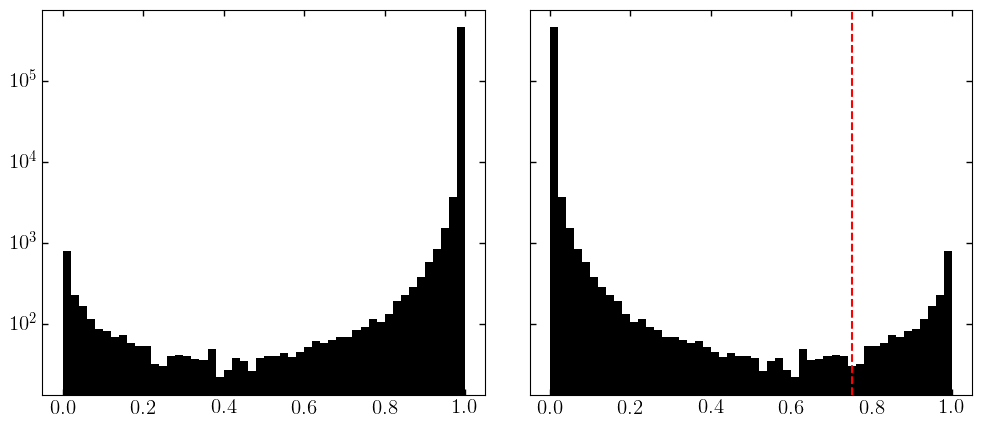

In [468]:
fig, [ax1, ax2] = plt.subplots(1, 2, figsize=(12,5), sharey=True)
ax1.hist(jnp.exp(lp_dict['background']) / sum_probs, bins=50)
ax1.set_yscale('log')

ax2.hist(memb_prob, bins=50)
ax2.set_yscale('log')
ax2.axvline(0.75, c='r', ls='--')

plt.show()

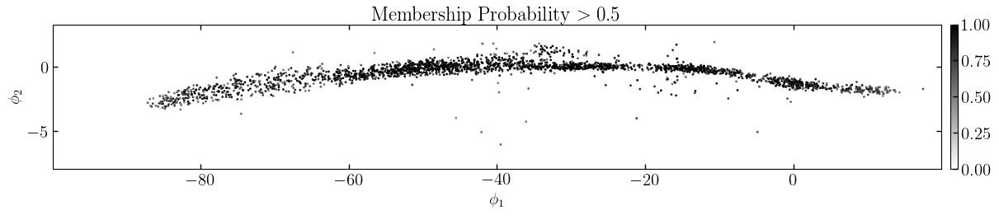

In [469]:
fig, ax1 = plt.subplots(1, 1, figsize=(12,2.5), sharex=True, sharey=True, constrained_layout=True)
im1 = ax1.scatter(all_data_[memb_sel1]['phi1'], all_data_[memb_sel1]['phi2'], c=memb_prob[memb_sel1], s=1, vmin=0, vmax=1, cmap='gray_r')
# ax1.scatter(all_data_[memb_sel1&cmd_sel]['phi1'], all_data_[memb_sel1&cmd_sel]['phi2'], s=1, c='r')
ax1.set_title(r'Membership Probability $> 0.5$')
ax1.set_xlim(coord_bounds['phi1'])
ax1.set_ylim(coord_bounds['phi2'])
ax1.set_xlabel(r'$\phi_1$')
ax1.set_ylabel(r'$\phi_2$')
cbar = fig.colorbar(im1, ax=ax1, pad=0.01)
plt.show()

/var/folders/f1/wqzqbly11d9__jf5mjckhwvm0000gq/T/ipykernel_55997/655019377.py:36: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax3.legend(ncols=4, loc='lower left', frameon=True, fancybox=True, edgecolor='k', framealpha=1, handletextpad=0.1)


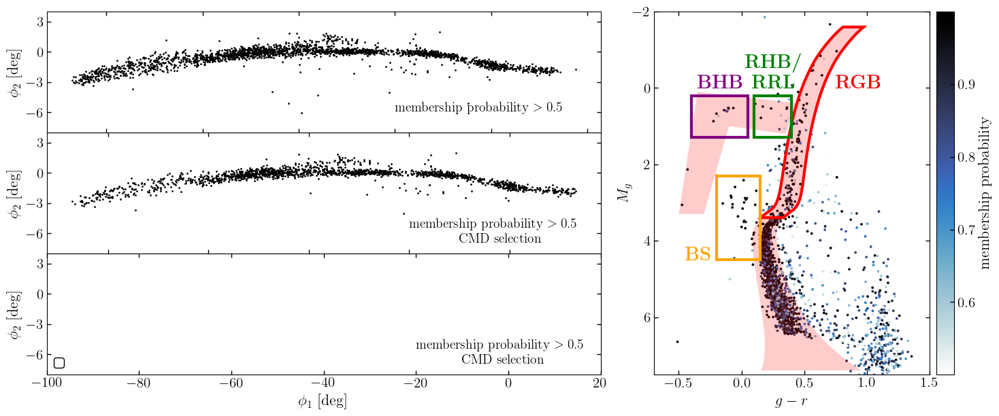

In [410]:
distmod_spl = np.poly1d([2.440e-4, 2.441e-2, 14.98]) #Valluri+24
dist_mod_correct_all = distmod_spl(all_data_[memb_sel1]["phi1"]) - iso_obj.dist_mod

from matplotlib.gridspec import GridSpec

fig = plt.figure(figsize=(15,6))
gs = GridSpec(6, 2, figure=fig, width_ratios=[1, 0.6], left=0.05, right=0.97, bottom=0.09, top=0.98, wspace=0.12)
ax1 = fig.add_subplot(gs[0:2, 0])
ax2 = fig.add_subplot(gs[2:4, 0], sharey=ax1)
ax3 = fig.add_subplot(gs[4:6, 0], sharey=ax1)
ax4 = fig.add_subplot(gs[:, 1])

ax1.scatter(all_data_[memb_sel1]['phi1'], all_data_[memb_sel1]['phi2'], s=1, rasterized=True)
ax1.text(-20,-6, 'membership probability $> 0.5$', fontsize=14)
# ax1.set_title(r'Membership Probability $> 0.5$')
ax1.set_xticklabels([])

# ax3.scatter(all_data_[memb_sel1]['phi1'], all_data_[memb_sel1]['phi2'], s=0.5, c='k', alpha=0.3)
ax2.scatter(all_data_[memb_sel1&cmd_sel]['phi1'], all_data_[memb_sel1&cmd_sel]['phi2'], s=1, c='k', rasterized=True)
ax2.text(-20,-5.5, r'membership probability $> 0.5$', fontsize=14)
ax2.text(-10,-7, 'CMD selection', fontsize=14, color='k')

# # ax3.scatter(all_data_[memb_sel1&rgb_sel&(G<3.4)]['phi1'], all_data_[memb_sel1&rgb_sel&(G<3.4)]['phi2'], 
# #            c='r', marker='o', s=5, label='RGB', rasterized=True)
# ax3.scatter(all_data_[memb_sel1&rrl_sel]['phi1'], all_data_[memb_sel1&rrl_sel]['phi2'], 
#            c='g', marker='P', s=15, label=r'RHB \&' + ' RRL', rasterized=True)
# ax3.scatter(all_data_[memb_sel1&bhb_sel]['phi1'], all_data_[memb_sel1&bhb_sel]['phi2'], 
#            c='purple', marker='X', s=15, label='BHB', rasterized=True)
# ax3.scatter(all_data_[memb_sel1&bs_sel]['phi1'], all_data_[memb_sel1&bs_sel]['phi2'], 
#            c='orange', marker='d', s=15, label='BS', rasterized=True)
ax3.text(-20,-5.5, r'membership probability $> 0.5$', fontsize=14)
ax3.text(-10,-7, 'CMD selection', fontsize=14, color='k')
ax3.set_xlim(-100, 20)
ax3.set_ylim(-8,4)
ax3.set_yticks([-6,-3,0,3])
ax3.legend(ncols=4, loc='lower left', frameon=True, fancybox=True, edgecolor='k', framealpha=1, handletextpad=0.1)

im = ax4.scatter(all_data_[memb_sel1]['g0'] - all_data_[memb_sel1]['r0'], 
            all_data_[memb_sel1]['g0'] - dist_mod_correct_all  - iso_obj.dist_mod,
            c = memb_prob[memb_sel1],
            cmap=cmr.arctic_r, s=3, rasterized=True)
cmd_patch = mpl.patches.Polygon(cmd_poly, facecolor="red", alpha=0.2)
hb_patch = mpl.patches.Polygon(hb_poly, facecolor="red", alpha=0.2)
rrl_patch = mpl.patches.Polygon(jnp.array([[0.1,1.3], [0.1,0.2], [0.4,0.2], [0.4,1.3]]), edgecolor="green", facecolor='none', lw=3)
bhb_patch = mpl.patches.Polygon(jnp.array([[-0.4,1.3], [-0.4,0.2], [0.05,0.2], [0.05,1.3]]), edgecolor="purple", facecolor='none', lw=3)
bs_patch = mpl.patches.Polygon(jnp.array([[-0.2,4.5], [-0.2,2.3], [0.15,2.3], [0.15,4.5]]), edgecolor="orange", facecolor='none', lw=3)
rgb_poly = cmd_poly[np.array(cmd_poly[:,1]) < 3.4]
rgb_patch = mpl.patches.Polygon(rgb_poly, edgecolor='red', facecolor='none', lw=3)
ax4.add_patch(cmd_patch) ; ax4.add_patch(hb_patch) ; ax4.add_patch(rgb_patch)
ax4.add_patch(rrl_patch) ; ax4.add_patch(bhb_patch) ; ax4.add_patch(bs_patch)
ax4.text(0.03,0,r'\textbf{RHB/}' + '\n' + r'\textbf{RRL}', color='green', fontsize=20, ma='center')
ax4.text(-0.35,0,r'\textbf{BHB}', color='purple', fontsize=20)
ax4.text(-0.45,4.5,r'\textbf{BS}', color='orange', fontsize=20)
ax4.text(0.75,0,r'\textbf{RGB}', color='red', fontsize=20)
ax4.set_xlabel(r'$g-r$', fontsize=16)
ax4.set_ylabel(r'$M_g$', fontsize=16, labelpad=0)
ax4.set_xlim(-0.7, 1.5)
ax4.set_ylim(7.5, -2)
cbar = fig.colorbar(im, ax=ax4, pad=0.02)
cbar.set_label('membership probability', fontsize=16)

ax1.set_ylabel(r'$\phi_2$ [deg]', fontsize=16)
ax2.set_ylabel(r'$\phi_2$ [deg]', fontsize=16)
ax3.set_ylabel(r'$\phi_2$ [deg]', fontsize=16)
ax3.set_xlabel(r'$\phi_1$ [deg]', fontsize=16)
plt.subplots_adjust(hspace=0, wspace=0.15)
# plt.savefig('../../paper_figures/high_prob_members.pdf')
# plt.savefig('../../paper_figures/high_prob_members.png')
plt.show()